## Terra Nova Bay Mooring Comparison - 2017 

### Goal: Use various analytical techniques to compare moorings DITN, D, DITS, DITD, and LDEO in 2017 to refine our understanding of winter-time circulation in mid-depths and abyssal. And water mass transformations that may help us infer circulation patterns 

### Techniques: 

Time series visualization, sliding window lag correlations, wavelet analysis, quiver plots, etc... 

### Background information: 





In [1]:
# import packages 
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr 
import gsw

In [2]:
%matplotlib widget

In [3]:
# update matplotlib font sizes so figures are readable 
plt.rcParams.update({
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
})

In [5]:
# Load in datatree (DELL)
moorings = xr.open_datatree('/Users/mblan/Documents/research/TNB_tools/examples/TNB_Moorings_DataTree.nc')

# Load in datatree (MAC)
# moorings = xr.open_datatree('TNB_Moorings_DataTree.nc')

In [6]:
moorings

<xarray.DataTree>
Group: /
├── Group: /DITD
│   ├── Group: /DITD/2017
│   │   ├── Group: /DITD/2017/vel
│   │   │   └── Group: /DITD/2017/vel/bot
│   │   │           Dimensions:  (time: 37488)
│   │   │           Coordinates:
│   │   │             * time     (time) datetime64[ns] 300kB 2017-02-08T20:30:00 ... 2018-03-06T0...
│   │   │               z        int64 8B ...
│   │   │               lat      float64 8B ...
│   │   │               lon      float64 8B ...
│   │   │           Data variables: (12/15)
│   │   │               dir      (time) float64 300kB ...
│   │   │               speed    (time) float64 300kB ...
│   │   │               temp     (time) float64 300kB ...
│   │   │               pres     (time) float64 300kB ...
│   │   │               hdgt     (time) float64 300kB ...
│   │   │               pitch    (time) float64 300kB ...
│   │   │               ...       ...
│   │   │               w        (time) float64 300kB ...
│   │   │               volt     (time) float64 300kB ...
│   │   │               amp1     (time) float64 300kB ...
│   │   │               amp2     (time) int64 300kB ...
│   │   │               amp3     (time) int64 300kB ...
│   │   │               depth    (time) float64 300kB ...
│   │   │           Attributes:
│   │   │               description:  Mooring DITD 1702 AQD
│   │   └── Group: /DITD/2017/ctd
│   │       └── Group: /DITD/2017/ctd/bot
│   │               Dimensions:  (time: 281162)
│   │               Coordinates:
│   │                 * time     (time) datetime64[ns] 2MB 2017-02-08T20:28:00 ... 2018-03-06T08:...
│   │                   z        int64 8B ...
│   │                   lat      float64 8B ...
│   │                   lon      float64 8B ...
│   │               Data variables:
│   │                   con      (time) float64 2MB ...
│   │                   temp     (time) float64 2MB ...
│   │                   pres     (time) float64 2MB ...
│   │                   depth    (time) float64 2MB ...
│   │                   sal      (time) float64 2MB ...
│   │                   sigma0   (time) float64 2MB ...
│   │               Attributes:
│   │                   description:  Mooring DITD 1702 SBE37SM
│   ├── Group: /DITD/2018
│   │   ├── Group: /DITD/2018/vel
│   │   │   ├── Group: /DITD/2018/vel/top
│   │   │   │       Dimensions:  (time: 43002)
│   │   │   │       Coordinates:
│   │   │   │         * time     (time) datetime64[ns] 344kB 2018-03-10T16:10:00 ... 2019-01-03T0...
│   │   │   │           z        int64 8B ...
│   │   │   │           lat      float64 8B ...
│   │   │   │           lon      float64 8B ...
│   │   │   │       Data variables: (12/15)
│   │   │   │           dir      (time) float64 344kB ...
│   │   │   │           speed    (time) float64 344kB ...
│   │   │   │           temp     (time) float64 344kB ...
│   │   │   │           pres     (time) float64 344kB ...
│   │   │   │           hdgt     (time) float64 344kB ...
│   │   │   │           pitch    (time) float64 344kB ...
│   │   │   │           ...       ...
│   │   │   │           w        (time) float64 344kB ...
│   │   │   │           volt     (time) float64 344kB ...
│   │   │   │           amp1     (time) float64 344kB ...
│   │   │   │           amp2     (time) float64 344kB ...
│   │   │   │           amp3     (time) float64 344kB ...
│   │   │   │           depth    (time) float64 344kB ...
│   │   │   │       Attributes:
│   │   │   │           description:  Mooring DITD 1803 AQD
│   │   │   └── Group: /DITD/2018/vel/bot
│   │   │           Dimensions:  (time: 43002)
│   │   │           Coordinates:
│   │   │             * time     (time) datetime64[ns] 344kB 2018-03-10T16:10:00 ... 2019-01-03T0...
│   │   │               z        int64 8B ...
│   │   │               lat      float64 8B ...
│   │   │               lon      float64 8B ...
│   │   │           Data variables: (12/15)
│   │   │               dir      (time) float64 344kB ...
│   │   │               speed    (t

In [7]:
# time is messed up on DITS, I will make my own time axis for now and will confirm this issue with Liv 
# start: 12/2/2017, end: 8/03/2018, dt = 600s
start = np.datetime64('2017-02-12T12')
end   = np.datetime64('2018-03-08T14:00:00')
dt    = np.timedelta64(600, 's')  # 600 seconds = 10 minutes

time = np.arange(start, end + dt, dt)

In [8]:
time

array(['2017-02-12T12:00:00', '2017-02-12T12:10:00',
       '2017-02-12T12:20:00', ..., '2018-03-08T13:40:00',
       '2018-03-08T13:50:00', '2018-03-08T14:00:00'],
      shape=(56029,), dtype='datetime64[s]')

In [9]:
DITS_2017 = moorings['DITS/2017/ctd/bot'].to_dataset().dropna(dim='time')

In [10]:
DITS_2017['time'] = time

In [11]:
moorings['DITS/2017/ctd/bot'] = DITS_2017

In [12]:
# drop nan from DITD bottom datasets 2018 - was causing plotting issues before 
# not sure why there were so many nans 
# sampling frequency in dataset was 1 min but should be 2 min based on Liv's paper 
moorings['DITD/2018/ctd/bot'] = moorings['DITD/2018/ctd/bot'].to_dataset().dropna(dim='time')

# same issue with DITN velocity 2018 
moorings['DITN/2018/vel/bot'] = moorings['DITN/2018/vel/bot'].to_dataset().dropna(dim='time')

### Data for 2017 and 2018

- All bottom sensor data for moorings (P2, P3, D, DITD, DITN, DITS, TNBD, LDEO)

- Notes: 
    - for 2018 using top sensor on DITD (1122 meters), using bottom sensor for 2017 (1225 meters)
        - bottom sensor exists for 2018 but velocity data cuts out in June and waiting to hear back from Liv on CTD data 
        - DITD usually has just one sensor at bottom 

    - Not using velocity data from P2 / P3 right now because paired with top sensor, not bottom 

In [13]:
# make a datatree for 2017 
# note: important to make this with copy - if not, moorings datatree will get effected 
ctd_2017= xr.DataTree(name='ctd_2017')
ctd_2017.children = {
    'DITD': moorings['DITD/2017/ctd/bot'].copy(),
    'D': moorings['D/2017/ctd/bot'].copy(),
    'LDEO': moorings['LDEO/2017/ctd/bot'].copy(),
    'DITN': moorings['DITN/2017/ctd/bot'].copy(),
    'DITS': moorings['DITS/2017/ctd/bot'].copy()
}

In [14]:
# make datatree for 2018 ctd data 
ctd_2018= xr.DataTree(name='ctd_2018')
ctd_2018.children = {
    'DITD': moorings['DITD/2018/ctd/bot'].copy(),
    'TNBD': moorings['TNBD/2018/ctd/bot'].copy(),
    'P2': moorings['P2/2018/ctd/bot'].copy(),
    'P3': moorings['P3/2018/ctd/bot'].copy(),
    'DITN': moorings['DITN/2018/ctd/bot'].copy(),
    'DITS': moorings['DITS/2018/ctd/bot'].copy().sel(time=slice('2018-03-15','2019-01-04'))
}

In [15]:
# make datatree for 2017 velocity 
vel_2017= xr.DataTree(name='vel_2017')
vel_2017.children = {
    'DITD': moorings['DITD/2017/vel/bot'].copy(),
    'D': moorings['D/2017/vel/bot'].copy().sel(time=slice('2017-02','2018-03-15')),
    'LDEO': moorings['LDEO/2017/vel/bot'].copy(),
    'DITN': moorings['DITN/2017/vel/bot'].copy(),
    'DITS': moorings['DITS/2017/vel/bot'].copy()
}

In [16]:
# make datatree for 2018 velocity 
# NOTE: Leaving P2/P3 out for now, velocity data is paired with top sensor. No velocity near bottom 
vel_2018= xr.DataTree(name='vel_2018')
vel_2018.children = {
    'DITD': moorings['DITD/2018/vel/bot'].copy(),
    'TNBD': moorings['TNBD/2018/vel/bot'].copy(),
    'DITN': moorings['DITN/2018/vel/bot'].copy(),
    'DITS': moorings['DITS/2018/vel/bot'].copy().sel(time=slice('2018-03','2019-01-04'))
}

In [17]:
def calculate_doy(ds):

    if "time" not in ds:
        return ds  # skip nodes without time

    x = ds.time.dt.dayofyear + ds.time.dt.hour / 24
    return ds.assign_coords(time_doy=x)

ctd_2017 = ctd_2017.map_over_datasets(calculate_doy)
ctd_2018 = ctd_2018.map_over_datasets(calculate_doy)

In [18]:
vel_2017 = vel_2017.map_over_datasets(calculate_doy)
vel_2018 = vel_2018.map_over_datasets(calculate_doy)

<>:26: SyntaxWarning: invalid escape sequence '\c'
<>:26: SyntaxWarning: invalid escape sequence '\c'
C:\Users\mblan\AppData\Local\Temp\ipykernel_11804\2502527906.py:26: SyntaxWarning: invalid escape sequence '\c'
  plt.ylabel("In-Situ \nTemperature [$^\circ$C]")


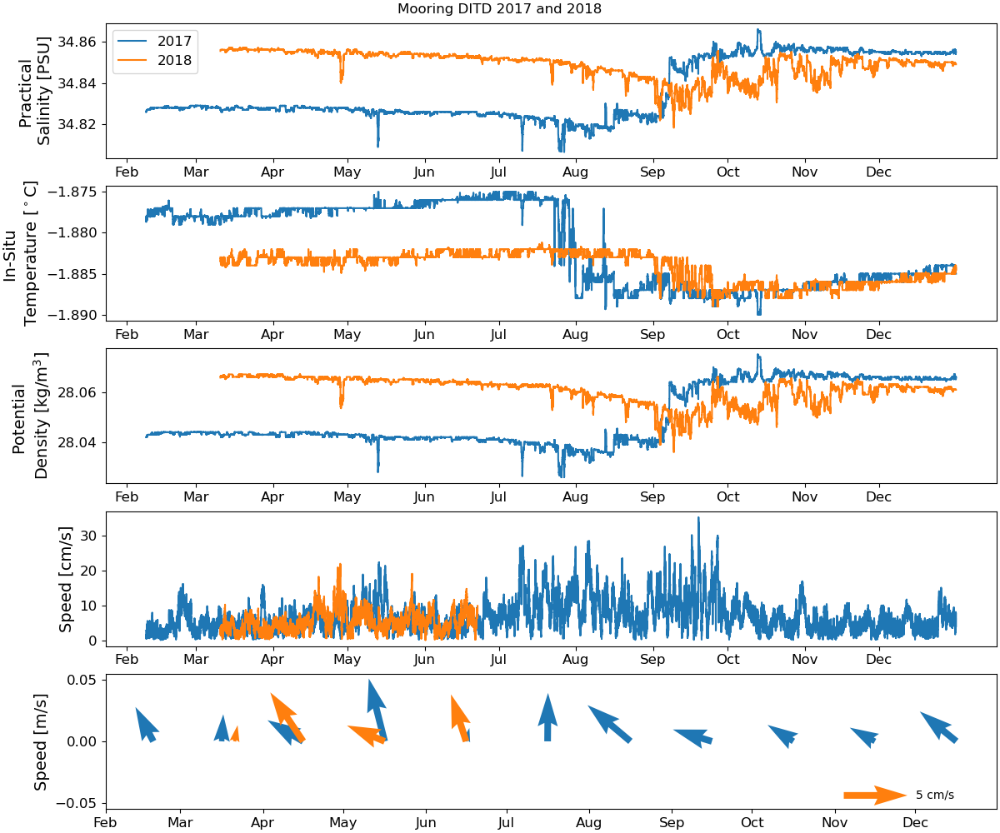

In [19]:
# 30 minute rolling average on CTD data 
fig = plt.figure(figsize=(12,10), constrained_layout=True)

def xaxis_months():
    month_starts = [32,60,91,121,152,182,213,244,274,305,335]

    plt.xticks(month_starts,
            ["Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"])
    # plt.xlabel("Month")

plt.suptitle('Mooring DITD 2017 and 2018')

ds1 = ctd_2017['DITD'].to_dataset().sel(time=slice('2017')).rolling(time=15).mean()
ds2 = ctd_2018['DITD'].to_dataset().sel(time=slice('2018')).rolling(time=10).mean()
plt.subplot(5,1,1)
plt.plot(ds1.time_doy,ds1.sal,label='2017')
plt.plot(ds2.time_doy,ds2.sal,label='2018')
plt.ylabel('Practical \nSalinity [PSU]')
plt.legend()
xaxis_months()

plt.subplot(5,1,2)
plt.plot(ds1.time_doy,ds1.temp,label='2017')
plt.plot(ds2.time_doy,ds2.temp,label='2018')
plt.ylabel("In-Situ \nTemperature [$^\circ$C]")
xaxis_months()

plt.subplot(5,1,3)
plt.plot(ds1.time_doy,ds1.sigma0,label='2017')
plt.plot(ds2.time_doy,ds2.sigma0,label='2018')
plt.ylabel("Potential \nDensity [kg/m$^3$]")
xaxis_months()

plt.subplot(5,1,4)
ds1 = vel_2017['DITD'].to_dataset().sel(time=slice('2017')).rolling(time=2).mean()
ds2 = vel_2018['DITD'].to_dataset().sel(time=slice('2018')).rolling(time=3).mean()
plt.plot(ds1.time_doy,ds1.speed,label='2017')
plt.plot(ds2.time_doy,ds2.speed,label='2018')
plt.ylabel('Speed [cm/s]')
xaxis_months()

plt.subplot(5,1,5)
ds1 = vel_2017['DITD'].to_dataset().sel(time=slice('2017'))
ds2 = vel_2018['DITD'].to_dataset().sel(time=slice('2018'))
q = plt.quiver(
    ds1.time_doy.resample(time='ME').mean().values,np.zeros(len(ds1.time_doy.resample(time='ME').mean())),
    ds1.u.resample(time='ME').mean(),
    ds1.v.resample(time='ME').mean(),
    scale=70, units='width',color='tab:blue'
)
q = plt.quiver(
    ds2.time_doy.resample(time='ME').mean().values,np.zeros(len(ds2.time_doy.resample(time='ME').mean())),
    ds2.u.resample(time='ME').mean(),
    ds2.v.resample(time='ME').mean(),
    scale=70, units='width',color='tab:orange'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')
plt.ylabel('Speed [m/s]')
# plt.xlabel('Day of Year')
xaxis_months()


# month_starts = [32,60,91,121,152,182,213,244,274,305,335]

# plt.xticks(month_starts,
#            ["Feb","Mar","Apr","May","Jun",
#             "Jul","Aug","Sep","Oct","Nov","Dec"])
# plt.xlabel("Month")

<>:23: SyntaxWarning: invalid escape sequence '\c'
<>:23: SyntaxWarning: invalid escape sequence '\c'
C:\Users\mblan\AppData\Local\Temp\ipykernel_11804\2821511860.py:23: SyntaxWarning: invalid escape sequence '\c'
  plt.ylabel("In-Situ \nTemperature [$^\circ$C]")


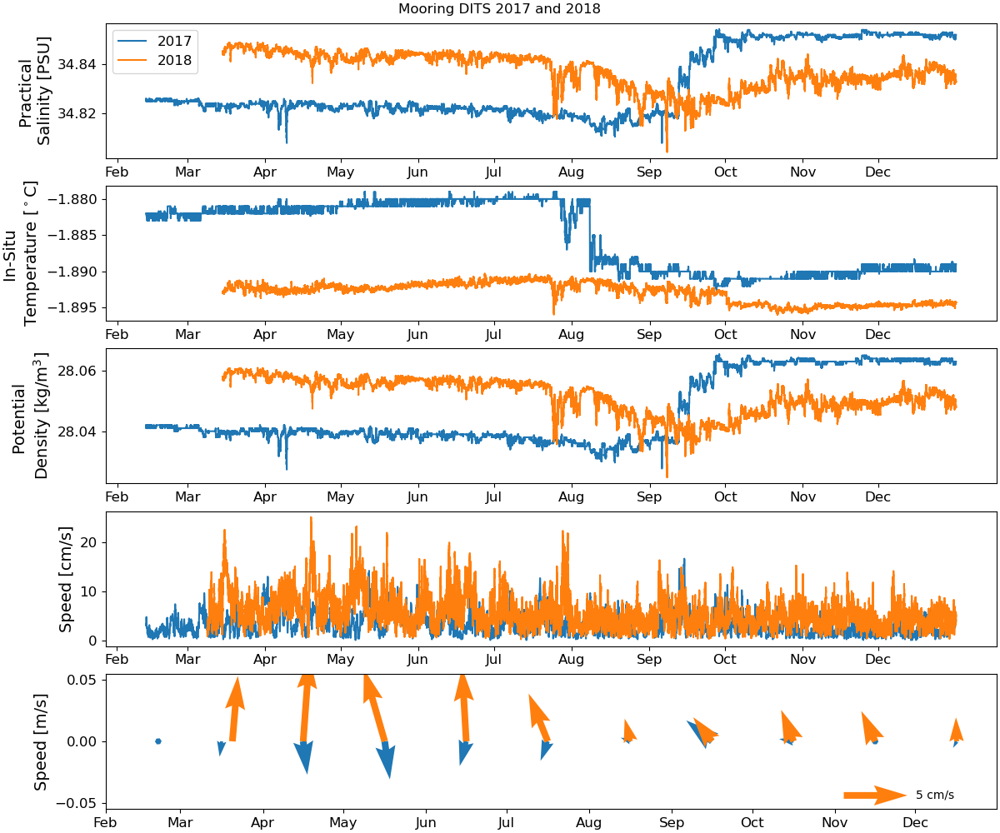

In [20]:
# 30 min average of CTD data 
fig = plt.figure(figsize=(12,10), constrained_layout=True)
def xaxis_months():
    month_starts = [32,60,91,121,152,182,213,244,274,305,335]

    plt.xticks(month_starts,
            ["Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"])
plt.suptitle('Mooring DITS 2017 and 2018')

ds1 = ctd_2017['DITS'].to_dataset().sel(time=slice('2017')).rolling(time=3).mean()
ds2 = ctd_2018['DITS'].to_dataset().sel(time=slice('2018')).rolling(time=15).mean()
plt.subplot(5,1,1)
plt.plot(ds1.time_doy,ds1.sal,label='2017')
plt.plot(ds2.time_doy,ds2.sal,label='2018')
plt.ylabel('Practical \nSalinity [PSU]')
plt.legend()
xaxis_months()

plt.subplot(5,1,2)
plt.plot(ds1.time_doy,ds1.temp,label='2017')
plt.plot(ds2.time_doy,ds2.temp,label='2018')
plt.ylabel("In-Situ \nTemperature [$^\circ$C]")
xaxis_months()

plt.subplot(5,1,3)
plt.plot(ds1.time_doy,ds1.sigma0,label='2017')
plt.plot(ds2.time_doy,ds2.sigma0,label='2018')
plt.ylabel("Potential \nDensity [kg/m$^3$]")
xaxis_months()

plt.subplot(5,1,4)
ds1 = vel_2017['DITS'].to_dataset().sel(time=slice('2017')).rolling(time=2).mean()
ds2 = vel_2018['DITS'].to_dataset().sel(time=slice('2018')).rolling(time=3).mean()
plt.plot(ds1.time_doy,ds1.speed,label='2017')
plt.plot(ds2.time_doy,ds2.speed,label='2018')
plt.ylabel('Speed [cm/s]')
xaxis_months()

plt.subplot(5,1,5)
ds1 = vel_2017['DITS'].to_dataset().sel(time=slice('2017'))
ds2 = vel_2018['DITS'].to_dataset().sel(time=slice('2018'))
q = plt.quiver(
    ds1.time_doy.resample(time='ME').mean().values,np.zeros(len(ds1.time_doy.resample(time='ME').mean())),
    ds1.u.resample(time='ME').mean(),
    ds1.v.resample(time='ME').mean(),
    scale=70, units='width',color='tab:blue'
)
q = plt.quiver(
    ds2.time_doy.resample(time='ME').mean().values,np.zeros(len(ds2.time_doy.resample(time='ME').mean())),
    ds2.u.resample(time='ME').mean(),
    ds2.v.resample(time='ME').mean(),
    scale=70, units='width',color='tab:orange'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')
plt.ylabel('Speed [m/s]')
# plt.xlabel('Day of Year')
xaxis_months()


# month_starts = [1,32,60,91,121,152,182,213,244,274,305,335]

# plt.xticks(month_starts,
#            ["Jan","Feb","Mar","Apr","May","Jun",
#             "Jul","Aug","Sep","Oct","Nov","Dec"])
# plt.xlabel("Month")

<>:23: SyntaxWarning: invalid escape sequence '\c'
<>:23: SyntaxWarning: invalid escape sequence '\c'
C:\Users\mblan\AppData\Local\Temp\ipykernel_11804\4120047209.py:23: SyntaxWarning: invalid escape sequence '\c'
  plt.ylabel("In-Situ \nTemperature [$^\circ$C]")


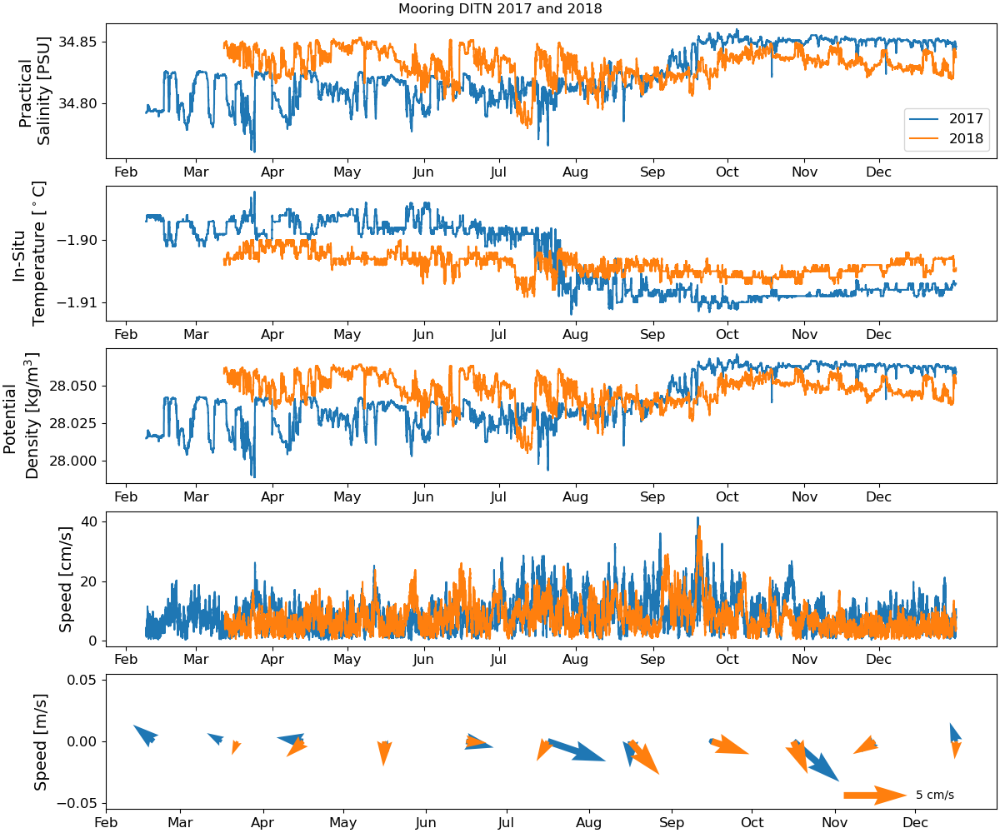

In [21]:
# 30 min rolling average on CTD data 
fig = plt.figure(figsize=(12,10), constrained_layout=True)
def xaxis_months():
    month_starts = [32,60,91,121,152,182,213,244,274,305,335]

    plt.xticks(month_starts,
            ["Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"])
plt.suptitle('Mooring DITN 2017 and 2018')

ds1 = ctd_2017['DITN'].to_dataset().sel(time=slice('2017')).rolling(time=15).mean()
ds2 = ctd_2018['DITN'].to_dataset().sel(time=slice('2018')).rolling(time=6).mean()
plt.subplot(5,1,1)
plt.plot(ds1.time_doy,ds1.sal,label='2017')
plt.plot(ds2.time_doy,ds2.sal,label='2018')
plt.ylabel('Practical \nSalinity [PSU]')
plt.legend()
xaxis_months()

plt.subplot(5,1,2)
plt.plot(ds1.time_doy,ds1.temp,label='2017')
plt.plot(ds2.time_doy,ds2.temp,label='2018')
plt.ylabel("In-Situ \nTemperature [$^\circ$C]")
xaxis_months()

plt.subplot(5,1,3)
plt.plot(ds1.time_doy,ds1.sigma0,label='2017')
plt.plot(ds2.time_doy,ds2.sigma0,label='2018')
plt.ylabel("Potential \nDensity [kg/m$^3$]")
xaxis_months()

plt.subplot(5,1,4)
ds1 = vel_2017['DITN'].to_dataset().sel(time=slice('2017')).rolling(time=2).mean()
ds2 = vel_2018['DITN'].to_dataset().sel(time=slice('2018')).rolling(time=3).mean()
plt.plot(ds1.time_doy,ds1.speed,label='2017')
plt.plot(ds2.time_doy,ds2.speed,label='2018')
plt.ylabel('Speed [cm/s]')
xaxis_months()

plt.subplot(5,1,5)
ds1 = vel_2017['DITN'].to_dataset().sel(time=slice('2017'))
ds2 = vel_2018['DITN'].to_dataset().sel(time=slice('2018'))
q = plt.quiver(
    ds1.time_doy.resample(time='ME').mean().values,np.zeros(len(ds1.time_doy.resample(time='ME').mean())),
    ds1.u.resample(time='ME').mean(),
    ds1.v.resample(time='ME').mean(),
    scale=70, units='width',color='tab:blue'
)
q = plt.quiver(
    ds2.time_doy.resample(time='ME').mean().values,np.zeros(len(ds2.time_doy.resample(time='ME').mean())),
    ds2.u.resample(time='ME').mean(),
    ds2.v.resample(time='ME').mean(),
    scale=70, units='width',color='tab:orange'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')
plt.ylabel('Speed [m/s]')
# plt.xlabel('Day of Year')
xaxis_months()


# month_starts = [1,32,60,91,121,152,182,213,244,274,305,335]

# plt.xticks(month_starts,
#            ["Jan","Feb","Mar","Apr","May","Jun",
#             "Jul","Aug","Sep","Oct","Nov","Dec"])
# plt.xlabel("Month")

In [22]:
# calculate potential density anomaly 
sigma0_anom = ctd_2017['DITD'].to_dataset().sel(time=slice('2017')).sigma0 - ctd_2017['DITD'].to_dataset().sel(time=slice('2017')).sigma0.mean()

In [56]:
sigma0_anom

<xarray.DataArray 'sigma0' (time: 234826)> Size: 2MB
array([-0.00786611, -0.00786611, -0.00786611, ...,  0.01613389,
        0.01613389,  0.01613389], shape=(234826,))
Coordinates:
    z         int64 8B 1225
  * time      (time) datetime64[ns] 2MB 2017-02-08T20:28:00 ... 2017-12-31T23...
    lat       float64 8B -75.28
    lon       float64 8B 164.1
    time_doy  (time) float64 2MB 39.83 39.83 39.83 39.83 ... 366.0 366.0 366.0

In [59]:
ctd_2017['DITD'].time

<xarray.DataArray 'time' (time: 281162)> Size: 2MB
array(['2017-02-08T20:28:00.000000000', '2017-02-08T20:30:00.000000000',
       '2017-02-08T20:32:00.000000000', ..., '2018-03-06T08:26:00.000000000',
       '2018-03-06T08:28:00.000000000', '2018-03-06T08:30:00.000000000'],
      shape=(281162,), dtype='datetime64[ns]')
Coordinates:
    z         int64 8B 1225
  * time      (time) datetime64[ns] 2MB 2017-02-08T20:28:00 ... 2018-03-06T08...
    lat       float64 8B -75.28
    lon       float64 8B 164.1
    time_doy  (time) float64 2MB 39.83 39.83 39.83 39.83 ... 65.33 65.33 65.33

In [58]:
vel_2017['DITD'].time

<xarray.DataArray 'time' (time: 37488)> Size: 300kB
array(['2017-02-08T20:30:00.000000000', '2017-02-08T20:45:00.000000000',
       '2017-02-08T21:00:00.000000000', ..., '2018-03-06T07:45:00.000000000',
       '2018-03-06T08:00:00.000000000', '2018-03-06T08:15:00.000000000'],
      shape=(37488,), dtype='datetime64[ns]')
Coordinates:
    z         int64 8B 1239
  * time      (time) datetime64[ns] 300kB 2017-02-08T20:30:00 ... 2018-03-06T...
    lat       float64 8B -75.28
    lon       float64 8B 164.1
    time_doy  (time) float64 300kB 39.83 39.83 39.88 39.88 ... 65.29 65.33 65.33

In [61]:
v = vel_2017['DITD'].to_dataset().resample(time='30min').mean().v

In [76]:
speed = vel_2017['DITD'].to_dataset().resample(time='30min').mean().speed

In [77]:
u = vel_2017['DITD'].to_dataset().resample(time='30min').mean().u

In [65]:
s = ctd_2017['DITD'].to_dataset().resample(time='30min').mean().sal

In [67]:
t = ctd_2017['DITD'].to_dataset().resample(time='30min').mean().temp

In [63]:
v

<xarray.DataArray 'v' (time: 18744)> Size: 150kB
array([-2.4159 , -1.6377 , -1.01405, ...,  2.4976 ,  2.4143 ,  3.23315],
      shape=(18744,))
Coordinates:
    z        int64 8B 1239
    lat      float64 8B -75.28
    lon      float64 8B 164.1
  * time     (time) datetime64[ns] 150kB 2017-02-08T20:30:00 ... 2018-03-06T0...
Attributes:
    long_name:  Northward Velocity
    units:      cm/s

In [69]:
s_anom = s.sel(time=slice('2017-02-08T20:30','2018-03-06T08:00')) - s.sel(time=slice('2017-02-08T20:30','2018-03-06T08:00')).mean()
t_anom = t.sel(time=slice('2017-02-08T20:30','2018-03-06T08:00')) - t.sel(time=slice('2017-02-08T20:30','2018-03-06T08:00')).mean()

In [73]:
import cmocean

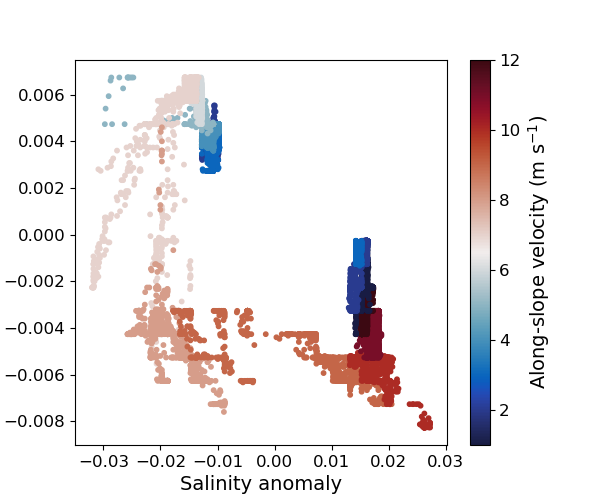

In [84]:
fig, ax = plt.subplots(figsize=(6,5))

sc = ax.scatter(
    s_anom,
    t_anom,
    c=u.time.dt.month,          # along-slope velocity
    s=10,
    cmap=cmocean.cm.balance
)

ax.set_xlabel('Salinity anomaly')
ax.set_ylabel('Temperature anomaly')

cbar = plt.colorbar(sc)
cbar.set_label('Along-slope velocity (m s$^{-1}$)')

plt.show()

Text(0.5, 1.0, 'Mooring DITD 2018 1218m')

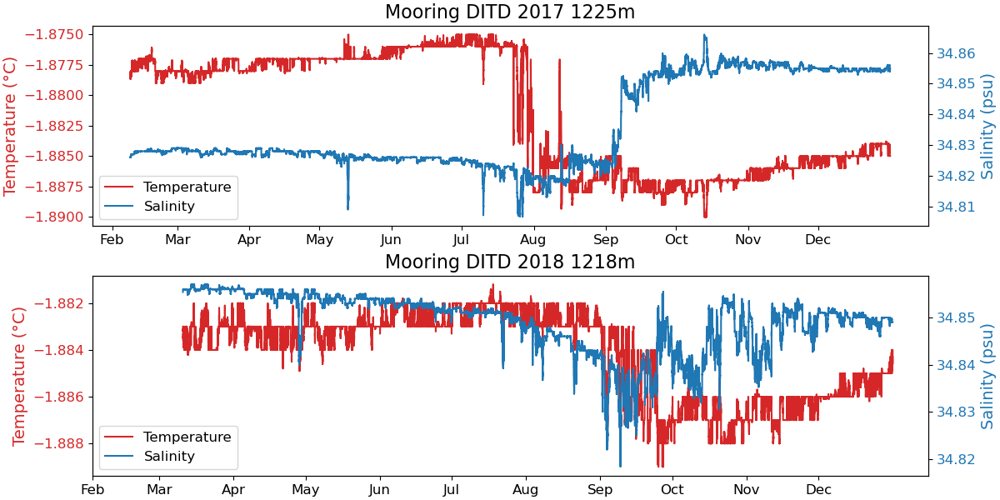

In [24]:
# Now make plots of temperature vs. salinity for each year and zoom into in-phase and out-of-phase sections 
fig = plt.figure(figsize=(12,6), constrained_layout=True)

def xaxis_months():
    month_starts = [32,60,91,121,152,182,213,244,274,305,335]

    ax.set_xticks(month_starts,
            ["Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"])

ds1 = ctd_2017['DITD'].to_dataset().sel(time=slice('2017')).rolling(time=15).mean()
ds2 = ctd_2018['DITD'].to_dataset().sel(time=slice('2018')).rolling(time=10).mean()

ax = plt.subplot(2,1,1)
# Left axis (temperature)
l1, = ax.plot(ds1.time_doy, ds1.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
xaxis_months()

# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds1.time_doy, ds1.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')

ax.set_title('Mooring DITD 2017 1225m')
# --- Density anomaly (second right axis)
# ax3 = ax1.twinx()

# # move third axis outward so it doesn't overlap
# ax3.spines["right"].set_position(("outward", 60))

# ax3.plot(sigma0_anom.time_doy, sigma0_anom, color='k')
# ax3.set_ylabel('Potential density anomaly (kg m$^{-3}$)', color='k')
# ax3.tick_params(axis='y', labelcolor='k')

ax = plt.subplot(2,1,2)
# Left axis (temperature)
l1, = ax.plot(ds2.time_doy, ds2.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds2.time_doy, ds2.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')
# ax.set_xlabel('Day of Year')
xaxis_months()

ax.set_title('Mooring DITD 2018 1218m')

In [44]:
ctd_2018['DITS'].z.values

array(1458)

Text(0.5, 1.0, 'Mooring DITS 2018 1458m')

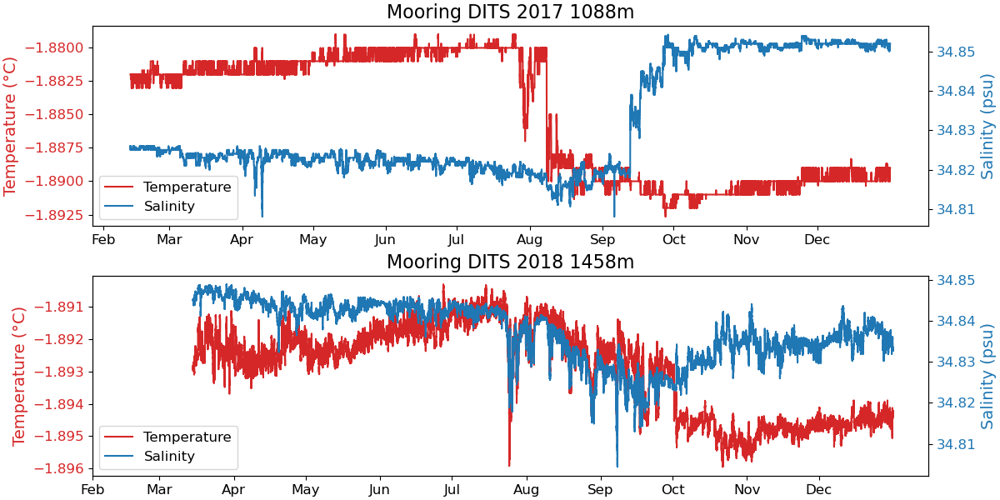

In [45]:
# Now make plots of temperature vs. salinity for each year and zoom into in-phase and out-of-phase sections 
fig = plt.figure(figsize=(12,6), constrained_layout=True)

def xaxis_months():
    month_starts = [32,60,91,121,152,182,213,244,274,305,335]

    ax.set_xticks(month_starts,
            ["Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"])

ds1 = ctd_2017['DITS'].to_dataset().sel(time=slice('2017')).rolling(time=3).mean()
ds2 = ctd_2018['DITS'].to_dataset().sel(time=slice('2018')).rolling(time=15).mean()

ax = plt.subplot(2,1,1)
# Left axis (temperature)
l1, = ax.plot(ds1.time_doy, ds1.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
xaxis_months()

# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds1.time_doy, ds1.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')

ax.set_title('Mooring DITS 2017 1088m')
# --- Density anomaly (second right axis)
# ax3 = ax1.twinx()

# # move third axis outward so it doesn't overlap
# ax3.spines["right"].set_position(("outward", 60))

# ax3.plot(sigma0_anom.time_doy, sigma0_anom, color='k')
# ax3.set_ylabel('Potential density anomaly (kg m$^{-3}$)', color='k')
# ax3.tick_params(axis='y', labelcolor='k')

ax = plt.subplot(2,1,2)
# Left axis (temperature)
l1, = ax.plot(ds2.time_doy, ds2.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds2.time_doy, ds2.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')
# ax.set_xlabel('Day of Year')
xaxis_months()

ax.set_title('Mooring DITS 2018 1458m')

In [49]:
ctd_2017['D']

<xarray.DataTree 'D'>
Group: /D
    Dimensions:       (time: 10456)
    Coordinates:
      * time          (time) datetime64[ns] 84kB 2017-02-11T07:35:00 ... 2017-09-...
        z             float64 8B 1.086e+03
        lat           float64 8B -75.14
        lon           float64 8B 164.6
        time_doy      (time) float64 84kB 42.29 42.33 42.33 ... 260.1 260.1 260.1
    Data variables:
        T_0           (time) float64 84kB ...
        S_0           (time) float64 84kB ...
        Conductivity  (time) float64 84kB ...
        Theta_0       (time) float64 84kB ...
        Oxygen        (time) float64 84kB ...
        Depth         (time) float64 84kB ...
        Density       (time) float64 84kB ...
        sal           (time) float64 84kB ...
        temp          (time) float64 84kB ...
    Attributes: (12/14)
        cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
        cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
        water_depth_meters:              -1144
        instr_depth_meters:              -1086
        instr_type:                      SBE 37 SMP ODO
        instr_sn:                        15450
        ...                              ...
        samp_int_minutes:                30
        start_time:                      11/02/2017 07:35:00
        stop_time:                       17/09/2017 23:05:00
        level_0:                         Raw data
        level_1:                         Despiking
        level_2:                         CTD quality check

Text(0.5, 1.0, 'Mooring D 2017 1086m')

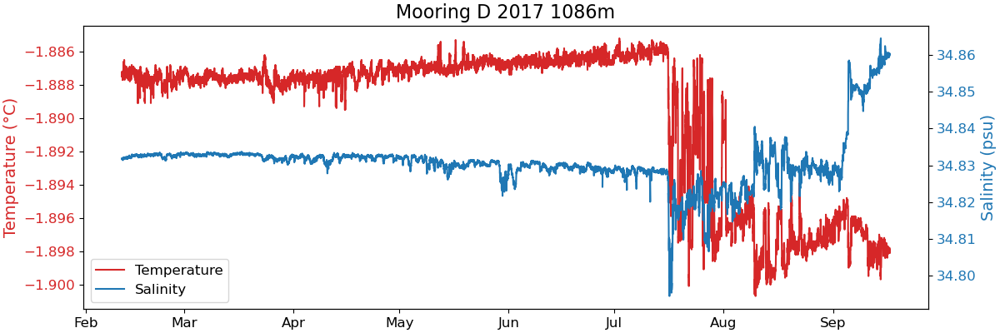

In [50]:
fig = plt.figure(figsize=(12,4), constrained_layout=True)

def xaxis_months():
    month_starts = [32,60,91,121,152,182,213,244,274,305,335]

    ax.set_xticks(month_starts,
            ["Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"])

# ds1 = ctd_2017['DITD'].to_dataset().sel(time=slice('2017')).rolling(time=15).mean()
ds1 = ctd_2017['D'].to_dataset().sel(time=slice('2017'))

ax = plt.subplot(1,1,1)
# Left axis (temperature)
l1, = ax.plot(ds1.time_doy, ds1.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
xaxis_months()

# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds1.time_doy, ds1.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')

ax.set_title('Mooring D 2017 1086m')

Text(0.5, 1.0, 'Mooring DITD 2018 1218m')

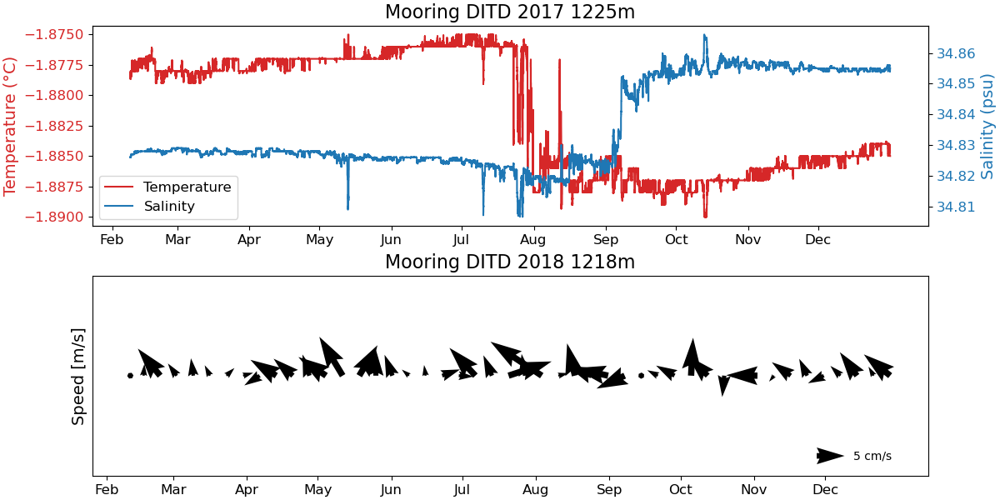

In [25]:
# Now make plots of temperature vs. salinity for each year and zoom into in-phase and out-of-phase sections 
fig = plt.figure(figsize=(12,6), constrained_layout=True)

def xaxis_months():
    month_starts = [32,60,91,121,152,182,213,244,274,305,335]

    ax.set_xticks(month_starts,
            ["Feb","Mar","Apr","May","Jun",
                "Jul","Aug","Sep","Oct","Nov","Dec"])

# ds1 = ctd_2017['DITD'].to_dataset().sel(time=slice('2017')).rolling(time=15).mean()
ds1 = ctd_2017['DITD'].to_dataset().sel(time=slice('2017')).rolling(time=15).mean()
ds2 = vel_2017['DITD'].to_dataset().sel(time=slice('2017'))

ax = plt.subplot(2,1,1)
# Left axis (temperature)
l1, = ax.plot(ds1.time_doy, ds1.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
xaxis_months()

# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds1.time_doy, ds1.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')

ax.set_title('Mooring DITD 2017 1225m')

ax = plt.subplot(2,1,2)
# Left axis (temperature)
# l1, = ax.plot(ds2.time_doy, ds2.temp, color='tab:red', label='Temperature')
# ax.set_ylabel('Temperature (°C)', color='tab:red')
# ax.tick_params(axis='y', labelcolor='tab:red')
# # Right axis (salinity)
# ax1 = ax.twinx()
# l2, = ax1.plot(ds2.time_doy, ds2.sal, color='tab:blue', label='Salinity')
# ax1.set_ylabel('Salinity (psu)', color='tab:blue')
# ax1.tick_params(axis='y', labelcolor='tab:blue')
# # Combine legends
# lines = [l1, l2]
# labels = [l.get_label() for l in lines]
# ax.legend(lines, labels, loc='lower left')
# ax.set_xlabel('Day of Year')
q = plt.quiver(
    ds2.time_doy.resample(time='W').mean().values,np.zeros(len(ds2.time_doy.resample(time='W').mean())),
    ds2.u.resample(time='W').mean(),
    ds2.v.resample(time='W').mean(),
    scale=150, units='width',color='k'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')
plt.ylabel('Speed [m/s]')
plt.yticks([])

xaxis_months()

ax.set_title('Mooring DITD 2018 1218m')

In [57]:
TNBD_resampled_ctd = ctd_2018['TNBD'].to_dataset().resample(time='15min').mean()

In [58]:
TNBD_resampled_vel = vel_2018['TNBD'].to_dataset().resample(time='15min').mean()

In [ ]:
# make TS diagram colored in by velocity for TNBD 
fig = plt.figure(figsize=(10,6), constrained_layout=True)
ax = plt.subplot(1,1,1)

ctd = TNBD_resampled_ctd
vel = TNBD_resampled_vel


# ----- Density Grid -----
mint = ctd.temp.min()
maxt = ctd.temp.max()
mins = ctd.sal.min()
maxs = ctd.sal.max()

tempL = np.linspace(mint.values - 0.1, maxt.values + 0.1, 200)
salL  = np.linspace(mins.values - 0.1, maxs.values + 0.1, 200)
Tg, Sg = np.meshgrid(tempL, salL)

sigma_theta = gsw.sigma0(Sg, Tg)



In [66]:
def TS_template(ax1):
    """ 
    """
    # Create figure
    # fig = plt.figure(figsize=(10, 6),constrained_layout=True)
    # # Top left square
    # ax1 = plt.subplot(1,1,1)

    mint=-3
    maxt=2
    mins=32
    maxs=37

    tempL=np.linspace(mint,maxt)
    salL=np.linspace(mins,maxs)
    Tg, Sg = np.meshgrid(tempL,salL)

    lon = 165
    lat = -75.0112
    p = 1093
    SA = gsw.SA_from_SP(Sg, p, lon, lat)
    CT = gsw.CT_from_pt(SA, Tg)
    # rho = gsw.rho(SA, Tg, 0)
    # sigma_theta = rho - 1000

    # CALCULATE DENSITY (METHOD 2)
    sigma_theta = gsw.sigma0(SA, CT)

    t_freezing1100 = gsw.t_freezing(gsw.SA_from_SP(salL, 0, lon, lat), p=0, saturation_fraction=0)
    plt.plot(salL, t_freezing1100, 'b--', label='Freezing Line at 0 dbar')

    cs = ax1.contour(Sg, Tg, sigma_theta, colors='k', zorder=1, alpha=0.7, levels=5)
    cl=plt.clabel(cs,fontsize=10,inline=True)

(34.8, 34.9)

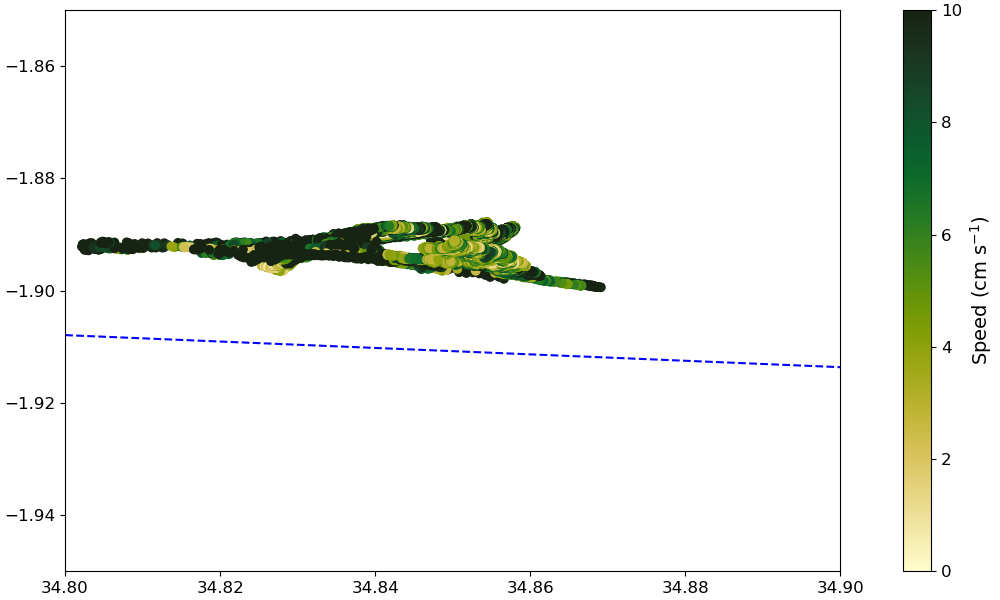

In [90]:
fig = plt.figure(figsize=(10, 6),constrained_layout=True)
ax1 = plt.subplot(1,1,1)
TS_template(ax1)

ctd = TNBD_resampled_ctd.sel(time=slice(None,'2019-01-03T23:45'))
vel = TNBD_resampled_vel.sel(time=slice('2018-03-13T20',None))

sc = ax1.scatter(ctd.sal,ctd.temp,c=vel.speed,cmap=cmocean.cm.speed, vmin=0,vmax=10)
cbar = fig.colorbar(sc, ax=ax1)
cbar.set_label('Speed (cm s$^{-1}$)')

plt.ylim(-1.95,-1.85)
plt.xlim(34.8,34.9)

# ds2 = moorings['DITD/2017/ctd/bot']
# ds3 = moorings['DITN/2017/ctd/mid']
# ds4 = moorings['DITN/2017/ctd/top']

# sc=ax1.scatter(ds2.sal,ds2.temp,s=2,label='',color='tab:blue')
# sc=ax1.scatter(ds3.sal,ds3.temp,s=2,label='',color='tab:red')
# sc=ax1.scatter(ds4.sal,ds4.temp,s=2,label='',color='tab:green')



In [91]:
# calculate temp and sal anomalies 
s_anom = ctd.sal - ctd.sal.mean()
t_anom = ctd.temp - ctd.temp.mean()


In [98]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

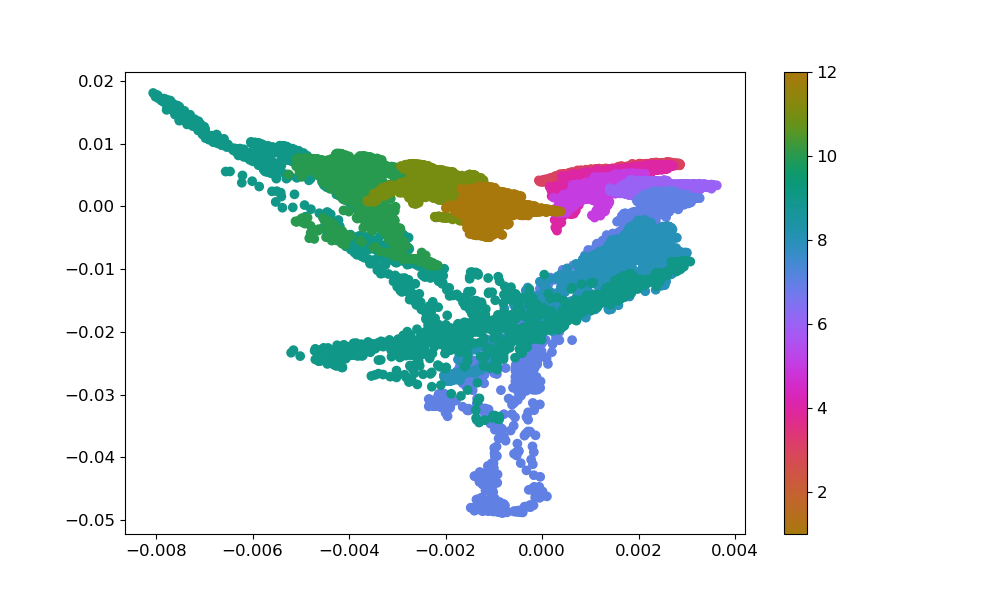

In [107]:
fig = plt.figure(figsize=(10,6))


# # Direction sector edges (degrees)
# bounds = np.arange(0, 361, 45)   # 0,45,...360

# # Colors for each sector (choose any)
# colors = [
#     '#08306b',  # N
#     '#2171b5',  # NE
#     '#41ab5d',  # E
#     '#78c679',  # SE
#     '#fd8d3c',  # S
#     '#f03b20',  # SW
#     '#7a0177',  # W
#     '#dd3497'   # NW
# ]

# cmap = ListedColormap(colors)
# norm = BoundaryNorm(bounds, cmap.N)
plt.scatter(t_anom,s_anom,c=vel.time.dt.month,cmap=cmocean.cm.phase)
plt.colorbar()

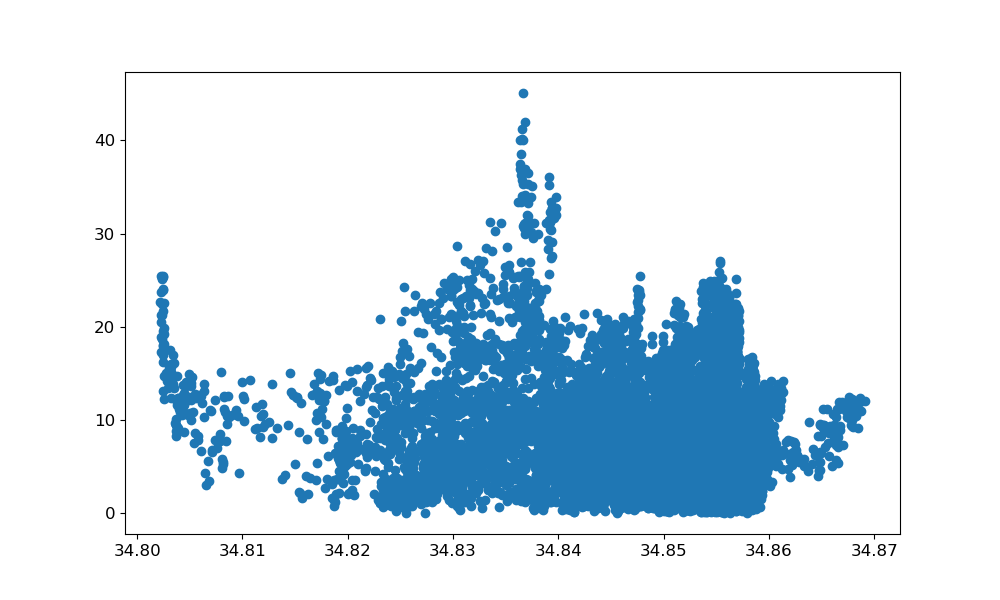

In [106]:
fig = plt.figure(figsize=(10,6))

plt.scatter(ctd.sal,vel.speed)

In [69]:
import cmocean

In [31]:
# get datasets aligned for TS diagram 
DITD_resampled = ctd_2017['DITD'].to_dataset().resample(time='15min').mean()

In [37]:
sal = DITD_resampled.isel(time=slice(1,-1)).sal
temp = DITD_resampled.isel(time=slice(1,-1)).temp

In [38]:
dir = vel_2017['DITD'].dir
speed = vel_2017['DITD'].speed 
u = vel_2017['DITD'].u
v = vel_2017['DITD'].v 

In [ ]:
# TS Diagram 


In [ ]:
# TS diagram colored in by direction 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import gsw

# Extract variables
temp = ctd_2017['DITD'].temp
sal  = ctd_2017['DITD'].sal
# time = pd.to_datetime(DITN_ctd_bot.time.values)
# years = time.year
# unique_years = np.unique(years)

# ----- Density Grid -----
mint = temp.min()
maxt = temp.max()
mins = sal.min()
maxs = sal.max()

tempL = np.linspace(mint.values - 0.1, maxt.values + 0.1, 200)
salL  = np.linspace(mins.values - 0.1, maxs.values + 0.1, 200)
Tg, Sg = np.meshgrid(tempL, salL)

sigma_theta = gsw.sigma0(Sg, Tg)

# ----- Make Figure -----
fig, ax = plt.subplots(figsize=(8,6))

# Density contours
cs = ax.contour(Sg, Tg, sigma_theta, colors='grey', zorder=1, linewidths=0.8)
cl = plt.clabel(cs, fontsize=8, inline=False)

# ----- Scatter by Year -----
# # cmap = plt.cm.get_cmap("tab20", len(unique_years))
# cmap = plt.cm.get_cmap("jet", len(unique_years))

# for i, yr in enumerate(unique_years):
#     idx = (years == yr)
#     ax.scatter(sal[idx], temp[idx], s=2, color=cmap(i),
#                label=str(yr), zorder=3)

# scatter 
ax.scatter(sal,temp,)

# ----- Freezing Temperature Line -----
t_freezing = gsw.t_freezing(salL, p=0, saturation_fraction=0)
ax.plot(salL, t_freezing, color='black', linewidth=1, zorder=2)

# ----- Labels + Decorations -----
ax.set_xlabel('Practical Salinity [g/kg]')
ax.set_ylabel('Potential Temperature [$^\circ$C]')
ax.set_title('Mooring DITN T/S Bottom Sensor (675 m)')

ax.legend(title="Year")
ax.grid(True, linestyle='--', alpha=0.3)
ax.tick_params(direction='out')

plt.tight_layout()
plt.show()

### Stopped here! 



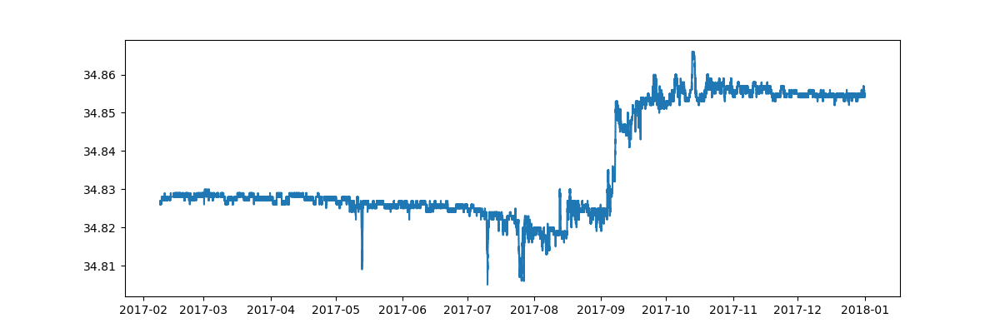

In [84]:
fig = plt.figure(figsize=(12,4))
plt.plot(test.time, test.sal)

In [71]:
test.groupby("time.month")

<DatasetGroupBy, grouped over 1 grouper(s), 12 groups in total:
    'month': UniqueGrouper('month'), 12/12 groups with labels 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12>

In [ ]:
test = ctd_2017['DITD'].to_dataset().assign_coords(month=ctd_2017['DITD'].time.dt.month)

<xarray.Dataset> Size: 18MB
Dimensions:  (time: 281162)
Coordinates:
  * time     (time) datetime64[ns] 2MB 2017-02-08T20:28:00 ... 2018-03-06T08:...
    z        int64 8B 1225
    lat      float64 8B ...
    lon      float64 8B ...
    month    (time) int64 2MB 2 2 2 2 2 2 2 2 2 2 2 2 ... 3 3 3 3 3 3 3 3 3 3 3
Data variables:
    con      (time) float64 2MB ...
    temp     (time) float64 2MB ...
    pres     (time) float64 2MB ...
    depth    (time) float64 2MB ...
    sal      (time) float64 2MB ...
    sigma0   (time) float64 2MB ...
Attributes:
    description:  Mooring DITD 1702 SBE37SM

In [54]:
# load in DITD data 
# ditd_vel1100 = xr.open_dataset('/Users/mackenzie/Documents/Research/PhD/TNB_Research/data/DITD_2018_2019/vel_1100.nc')
ditd_vel1200 = xr.open_dataset('/Users/mblan/Documents/TNB_Research/data/DITD_2018_2019/vel_1200.nc')

# ditd_sbe1100 = xr.open_dataset('/Users/mackenzie/Documents/Research/PhD/TNB_Research/data/DITD_2018_2019/sbe_1100.nc')
ditd_sbe1200 = xr.open_dataset('/Users/mblan/Documents/TNB_Research/data/DITD_2018_2019/sbe_1200.nc')

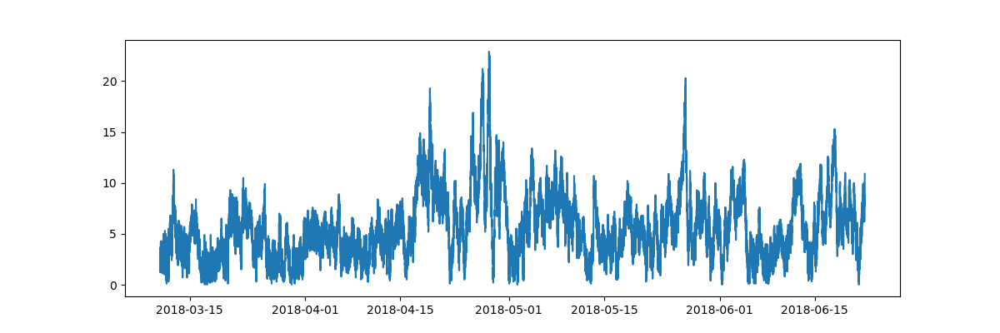

In [58]:
# verify DITD data 
fig = plt.figure(figsize=(12,4))
# plt.plot(ctd_2018['DITD'].time,ctd_2018['DITD'].sal)

# plt.plot(ditd_sbe1200.time,ditd_sbe1200.practical_salinity)

plt.plot(vel_2018['DITD'].time, vel_2018['DITD'].speed)

# This is the messed up data, need to bring in raw data I was previously working with 


### Investigate 2017 

In [11]:
moorings['D/2017/ctd/bot']

<xarray.DataTree 'bot'>
Group: /D/2017/ctd/bot
    Dimensions:       (time: 10456)
    Coordinates:
      * time          (time) datetime64[ns] 84kB 2017-02-11T07:35:00 ... 2017-09-...
        z             float64 8B ...
        lat           float64 8B ...
        lon           float64 8B ...
    Data variables:
        T_0           (time) float64 84kB ...
        S_0           (time) float64 84kB ...
        Conductivity  (time) float64 84kB ...
        Theta_0       (time) float64 84kB ...
        Oxygen        (time) float64 84kB ...
        Depth         (time) float64 84kB ...
        Density       (time) float64 84kB ...
        sal           (time) float64 84kB 34.83 34.83 34.83 ... 34.86 34.86 34.86
        temp          (time) float64 84kB -1.887 -1.887 -1.887 ... -1.898 -1.898
    Attributes: (12/14)
        cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
        cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
        water_depth_meters:              -1144
        instr_depth_meters:              -1086
        instr_type:                      SBE 37 SMP ODO
        instr_sn:                        15450
        ...                              ...
        samp_int_minutes:                30
        start_time:                      11/02/2017 07:35:00
        stop_time:                       17/09/2017 23:05:00
        level_0:                         Raw data
        level_1:                         Despiking
        level_2:                         CTD quality check

In [49]:
moorings['D/2017/vel/bot']

<xarray.DataTree 'bot'>
Group: /D/2017/vel/bot
    Dimensions:  (time: 35357)
    Coordinates:
      * time     (time) datetime64[ns] 283kB 2017-02-11T07:02:19 ... 2019-02-17T2...
        z        float64 8B ...
        lat      float64 8B ...
        lon      float64 8B ...
    Data variables:
        u        (time) float64 283kB ...
        v        (time) float64 283kB ...
        Mod_0    (time) float64 283kB ...
        Dir_0    (time) float64 283kB ...
        T_0      (time) float64 283kB ...
        TiltX    (time) float64 283kB ...
        TiltY    (time) float64 283kB ...
        Heading  (time) float64 283kB ...
    Attributes: (12/14)
        cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
        cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
        water_depth_meters:              -1144
        instr_depth_meters:              -1135
        instr_type:                      Aanderaa Seaguard
        instr_sn:                        444
        ...                              ...
        samp_int_minutes:                30
        start_time:                      11/02/2017 07:02:19
        stop_time:                       17/02/2019 21:02:19
        level_0:                         Raw data
        level_1:                         Despiking
        level_2:                         CTD quality check

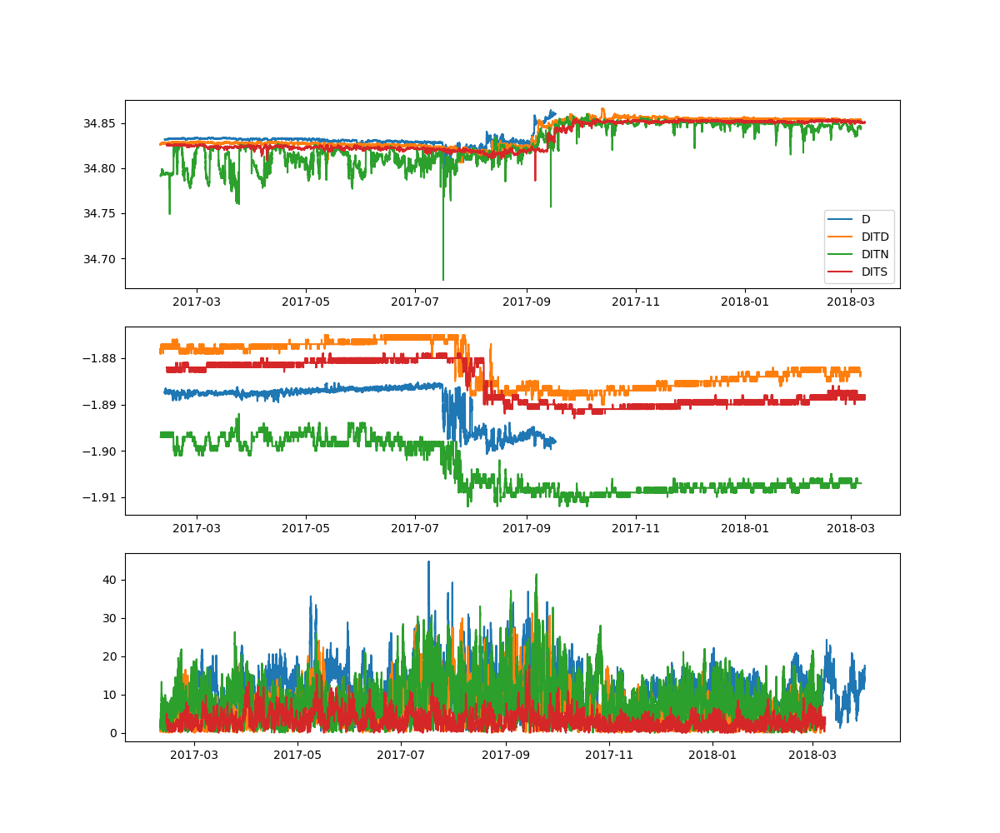

In [53]:
fig = plt.figure(figsize=(12,10))

plt.subplot(3,1,1)
plt.plot(moorings['D/2017/ctd/bot'].time,moorings['D/2017/ctd/bot'].sal,label='D')
plt.plot(moorings['DITD/2017/ctd/bot'].time,moorings['DITD/2017/ctd/bot'].sal,label='DITD')
plt.plot(moorings['DITN/2017/ctd/bot'].time,moorings['DITN/2017/ctd/bot'].sal,label='DITN')
plt.plot(moorings['DITS/2017/ctd/bot'].time,moorings['DITS/2017/ctd/bot'].sal,label='DITS')
plt.legend()

plt.subplot(3,1,2)
plt.plot(moorings['D/2017/ctd/bot'].time,moorings['D/2017/ctd/bot'].temp,label='D')
plt.plot(moorings['DITD/2017/ctd/bot'].time,moorings['DITD/2017/ctd/bot'].temp,label='DITD')
plt.plot(moorings['DITN/2017/ctd/bot'].time,moorings['DITN/2017/ctd/bot'].temp,label='DITN')
plt.plot(moorings['DITS/2017/ctd/bot'].time,moorings['DITS/2017/ctd/bot'].temp,label='DITS')

plt.subplot(3,1,3)
plt.plot(moorings['D/2017/vel/bot'].time.sel(time=slice('2017-03','2018-03')),
         moorings['D/2017/vel/bot'].Mod_0.sel(time=slice('2017-03','2018-03')),label='D')
plt.plot(moorings['DITD/2017/vel/bot'].time,moorings['DITD/2017/vel/bot'].speed,label='DITD')
plt.plot(moorings['DITN/2017/vel/bot'].time,moorings['DITN/2017/vel/bot'].speed,label='DITN')
plt.plot(moorings['DITS/2017/vel/bot'].time,moorings['DITS/2017/vel/bot'].speed,label='DITS')


Text(0.5, 1.0, 'Mooring DITD 2017 1200m')

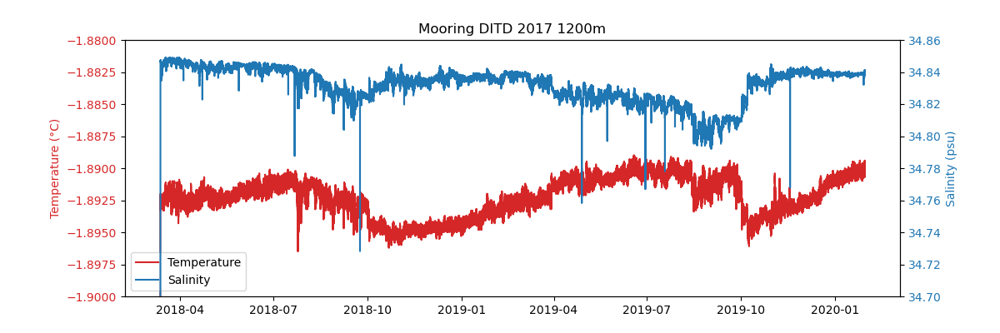

In [38]:
# mooring D 
ds = moorings['DITS/2018/ctd/bot']
fig,ax = plt.subplots(figsize=(12,4))

# Left axis (temperature)
l1, = ax.plot(ds.time, ds.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
ax.set_ylim(-1.90,-1.88)

# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds.time, ds.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_ylim(34.7,34.86)

# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')

ax.set_title('Mooring DITD 2017 1200m')

# plt.savefig('MooringDITD_temp_sal.png')

In [ ]:
# mooring D 
ds = moorings['DITD/2017/ctd/bot']
fig,ax = plt.subplots(figsize=(12,4))

# Left axis (temperature)
l1, = ax.plot(ds.time, ds.temp, color='tab:red', label='Temperature')
ax.set_ylabel('Temperature (°C)', color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
ax.set_ylim(-1.90,-1.88)

# Right axis (salinity)
ax1 = ax.twinx()
l2, = ax1.plot(ds.time, ds.sal, color='tab:blue', label='Salinity')
ax1.set_ylabel('Salinity (psu)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_ylim(34.7,34.86)

# Combine legends
lines = [l1, l2]
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='lower left')

ax.set_title('Mooring DITD 2017 1200m')



Text(0, 0.5, 'Velocity (m/s)')

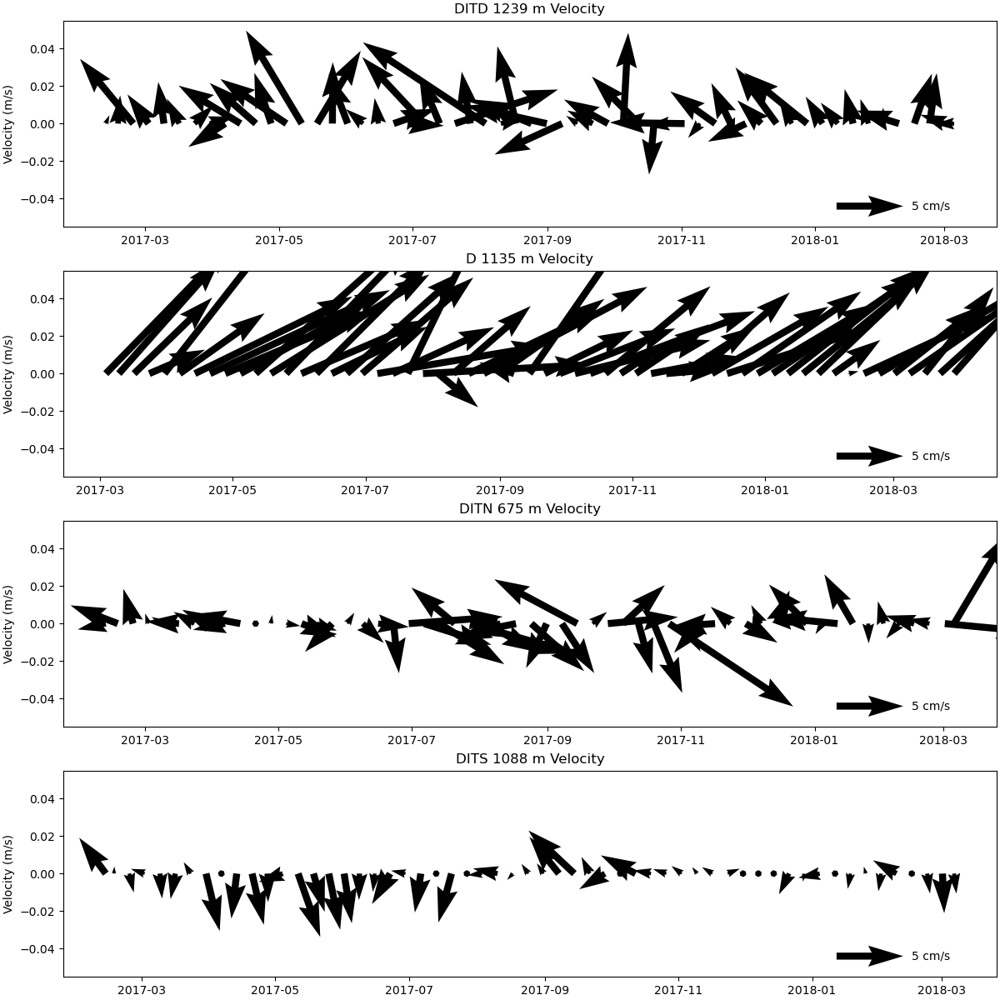

In [39]:
fig = plt.figure(figsize=(12,12),constrained_layout=True)

plt.subplot(4,1,1)
ds = moorings['DITD/2017/vel/bot']
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('DITD 1239 m Velocity')
plt.ylabel('Velocity (m/s)')

plt.subplot(4,1,2)
ds = moorings['D/2017/vel/bot'].to_dataset().sel(time=slice('2017-03','2018-03'))
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('D 1135 m Velocity')
plt.ylabel('Velocity (m/s)')

plt.subplot(4,1,3)
ds = moorings['DITN/2017/vel/bot']
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('DITN 675 m Velocity')
plt.ylabel('Velocity (m/s)')

plt.subplot(4,1,4)
ds = moorings['DITS/2017/vel/bot']
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('DITS 1088 m Velocity')
plt.ylabel('Velocity (m/s)')

# plt.savefig('veloctiy_deep_sensors_2017.png')

### Previous Work 

In [5]:
# mooring selection
# we want: 2017 data for D, DITN, LDEO, and DITS
# D @ 
D_2017 = moorings['D/2017']
DITN_2017 = moorings['DITN/2017']
DITS_2017 = moorings['DITS/2017']
LDEO = moorings['LDEO/2017']
DITD_2017 = moorings['DITD/2017']

In [6]:
DITD_2017.vel.bot.z.values

array(1239)

Text(0.5, 0.98, 'DITD 2017 1239 meters')

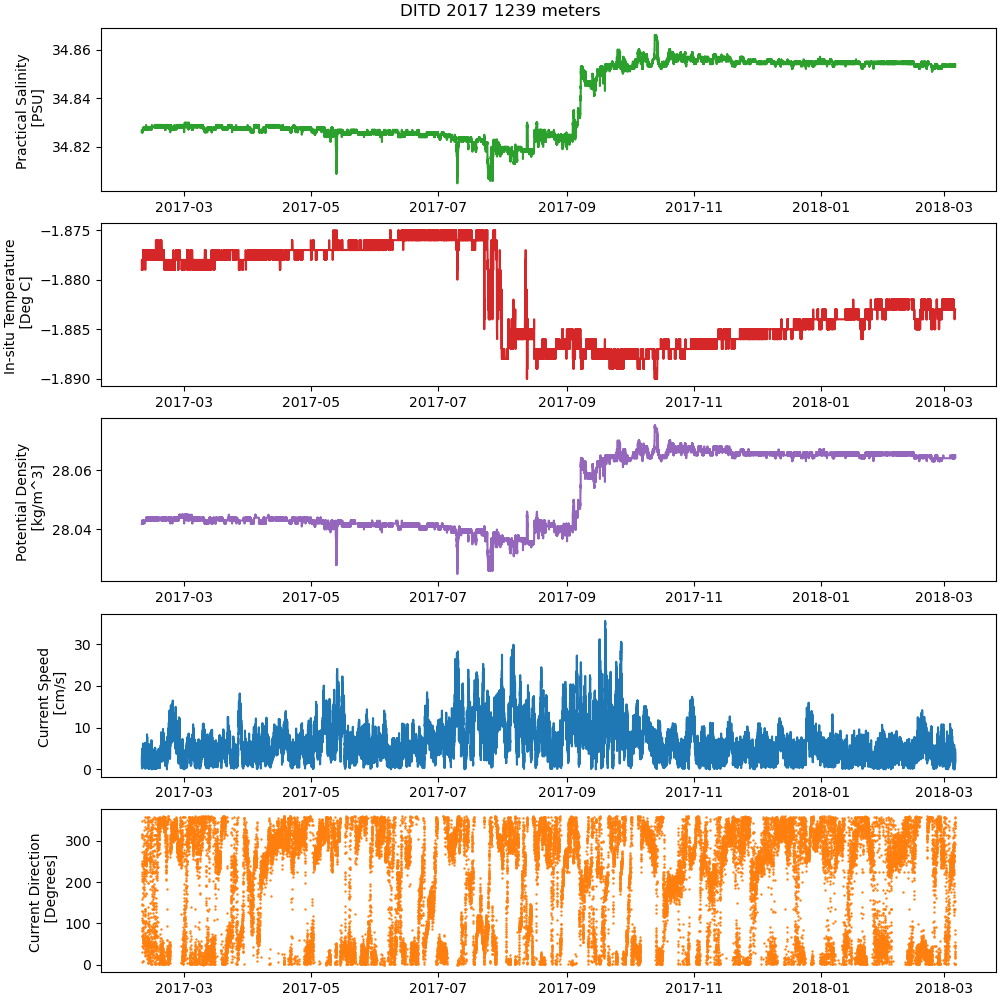

In [7]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = DITD_2017.ctd.bot
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = DITD_2017.vel.bot
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITD 2017 1239 meters')

In [8]:
DITS_2017.ctd.bot

<xarray.DataTree 'bot'>
Group: /DITS/2017/ctd/bot
    Dimensions:  (time: 112059)
    Coordinates:
        z        int64 8B ...
      * time     (time) datetime64[ns] 896kB 2017-02-12T12:00:00 ... 2018-03-08T1...
        lat      float64 8B ...
        lon      float64 8B ...
    Data variables:
        con      (time) float64 896kB ...
        temp     (time) float64 896kB ...
        pres     (time) float64 896kB ...
        depth    (time) float64 896kB ...
        sal      (time) float64 896kB ...
        sigma0   (time) float64 896kB ...
    Attributes:
        description:  Mooring DITS 1702 SBE37SM

Text(0.5, 0.98, 'DITS 2017 1088 meters')

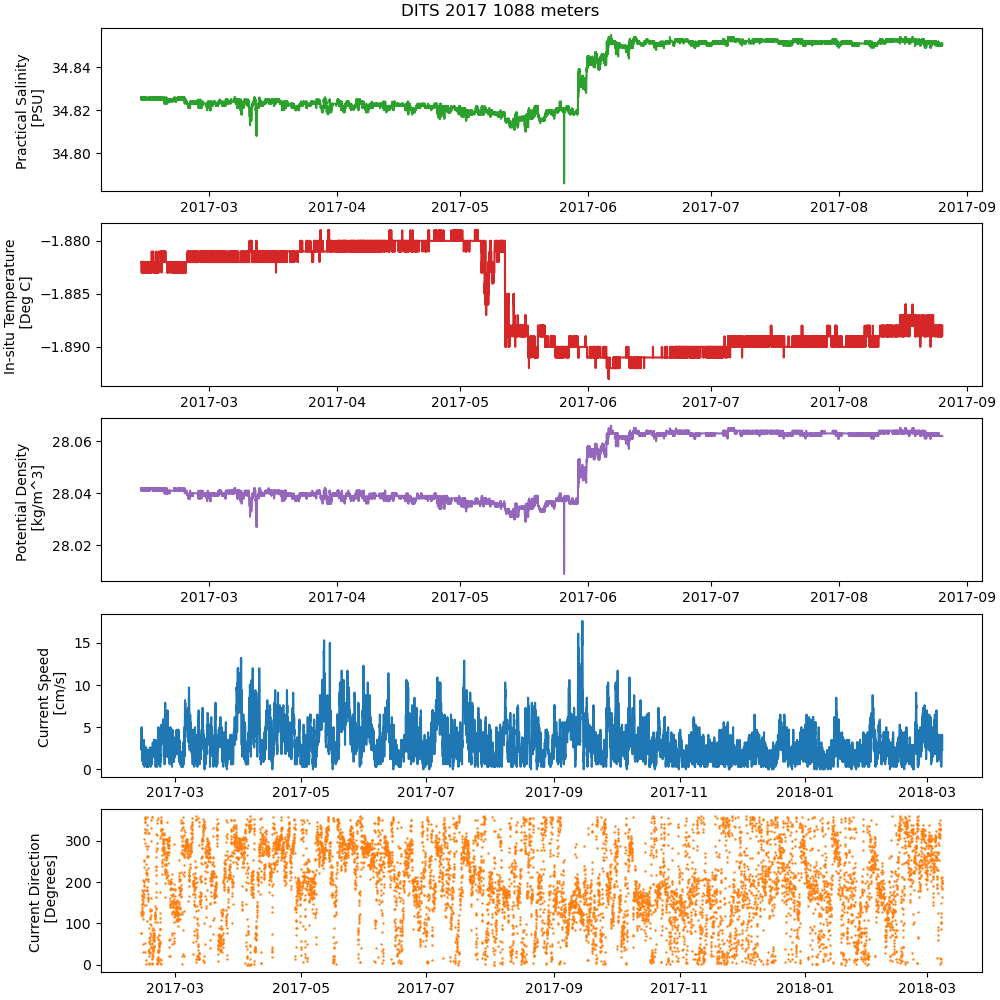

In [9]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = DITS_2017.ctd.bot
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = DITS_2017.vel.bot
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITS 2017 1088 meters')

#### Question: 

Why does DITS ctd data stop in 2017-09? 



In [10]:
ds.z.values

array(1087)

Text(0.5, 0.98, 'DITS 2017 191 meters')

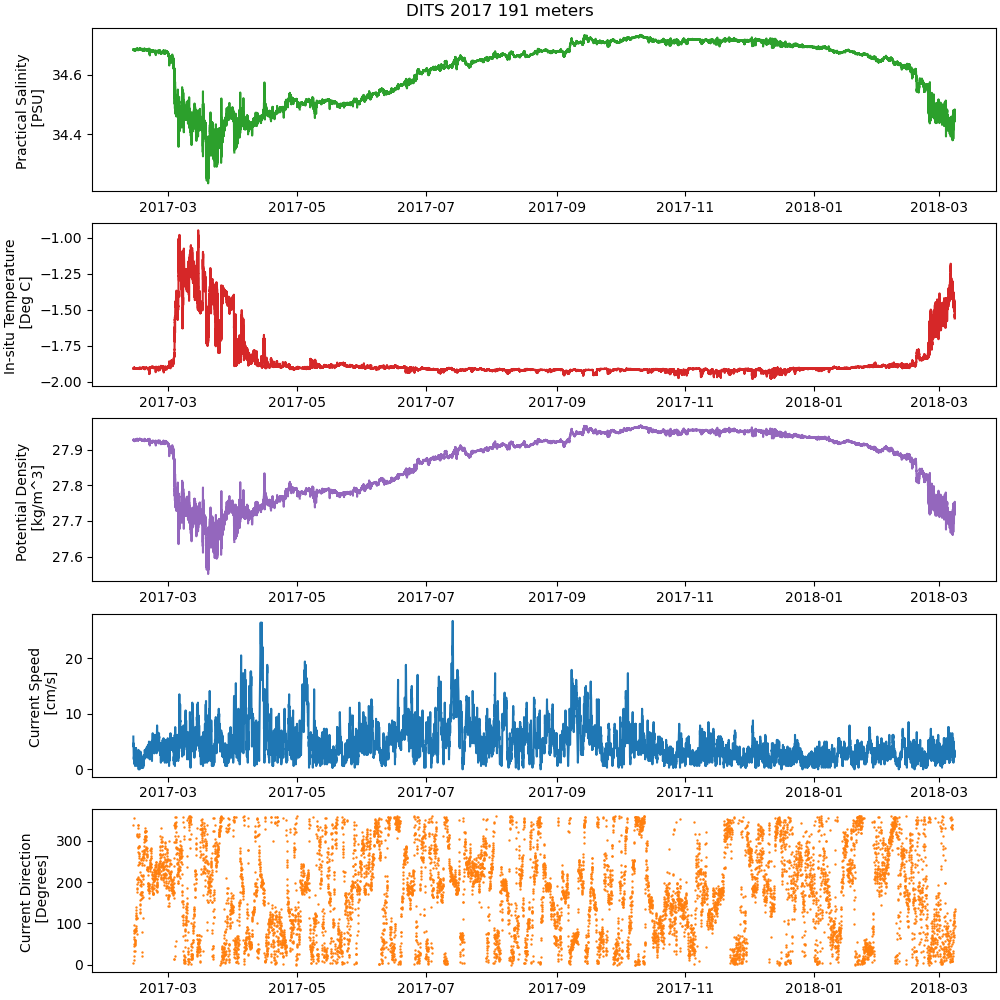

In [11]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = DITS_2017.ctd.top
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = DITS_2017.vel.top
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITS 2017 191 meters')

Text(0.5, 0.98, 'DITS 2017 384 meters')

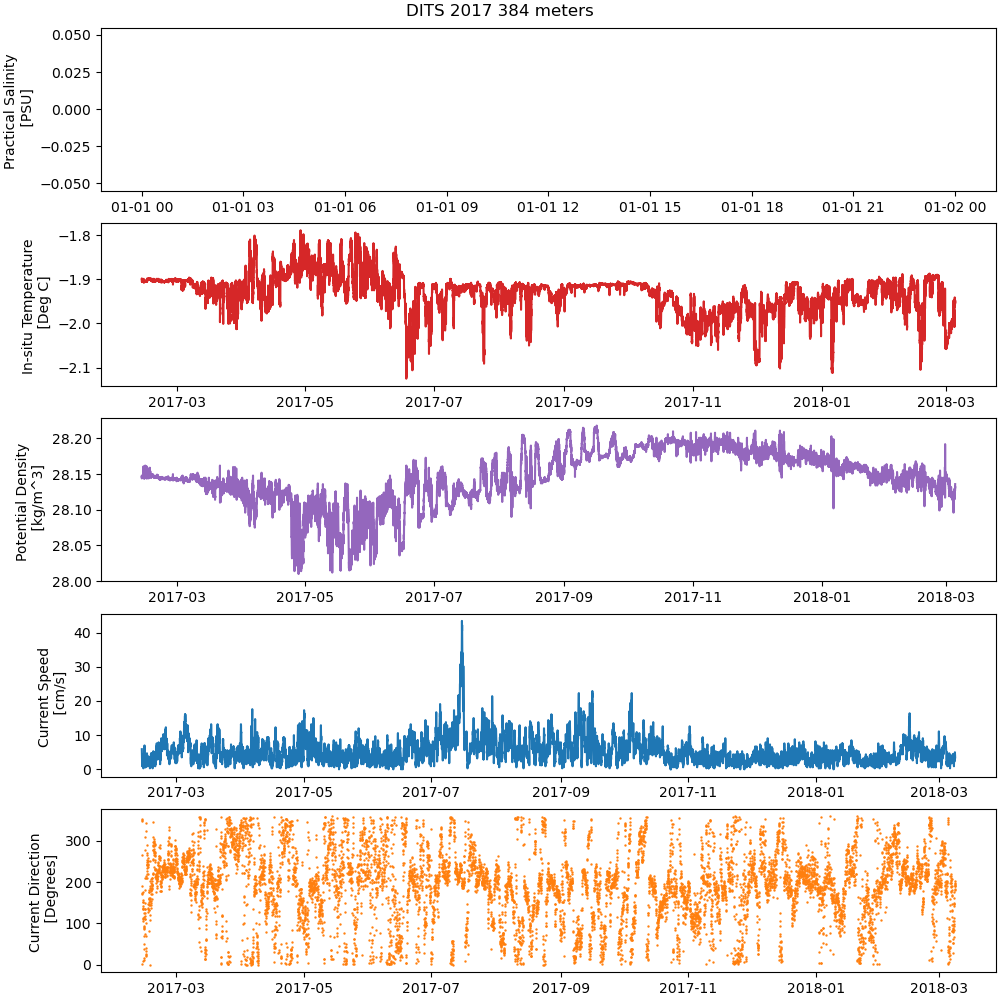

In [12]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = DITS_2017.ctd.mid
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = DITS_2017.vel.mid
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITS 2017 384 meters')

#### Question:

why is there no salinity data at DITS 384 meters in 2017? This data has been cited in Stevens et al. 2024 yet Liv's paper states "faulty P and S data removed" 

In [13]:
ds.z.values

array(384)

Text(0.5, 0.98, 'DITN 2017 76 meters')

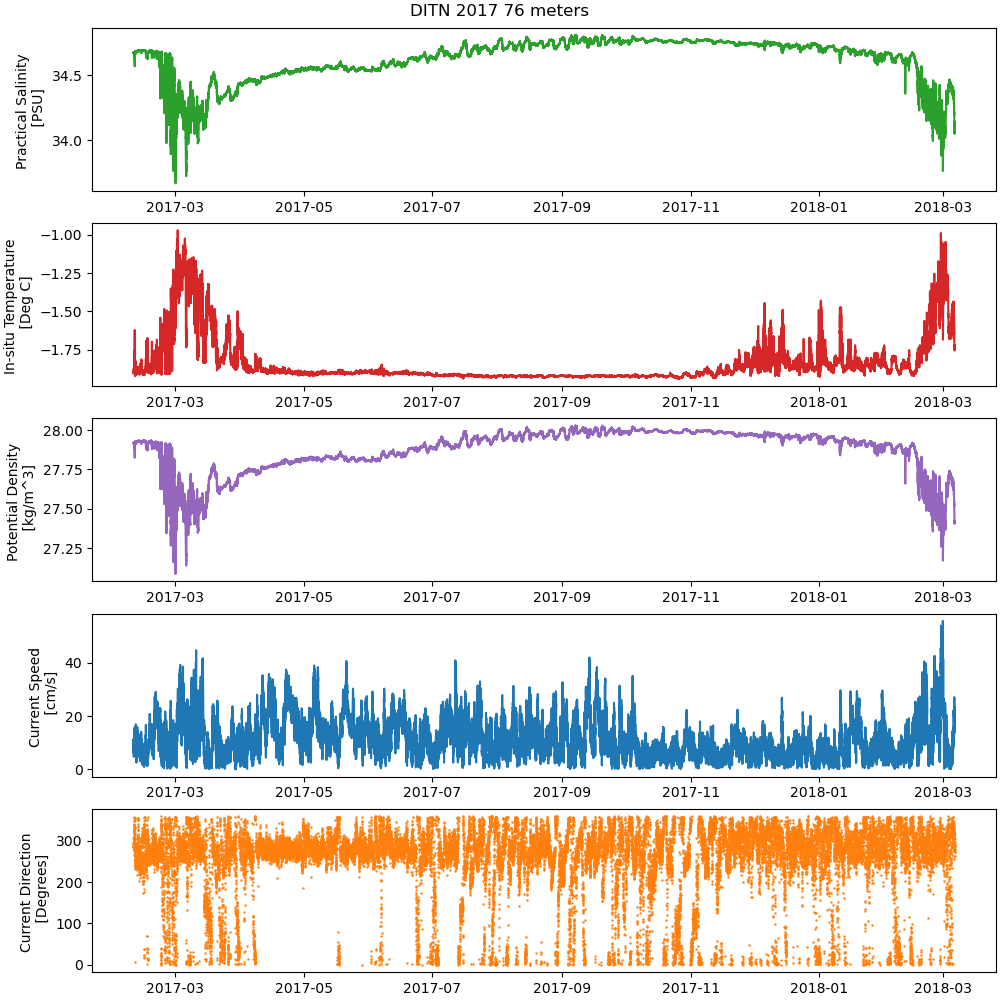

In [14]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = DITN_2017.ctd.top
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = DITN_2017.vel.top
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITN 2017 76 meters')

Text(0.5, 0.98, 'DITN 2017 271 meters')

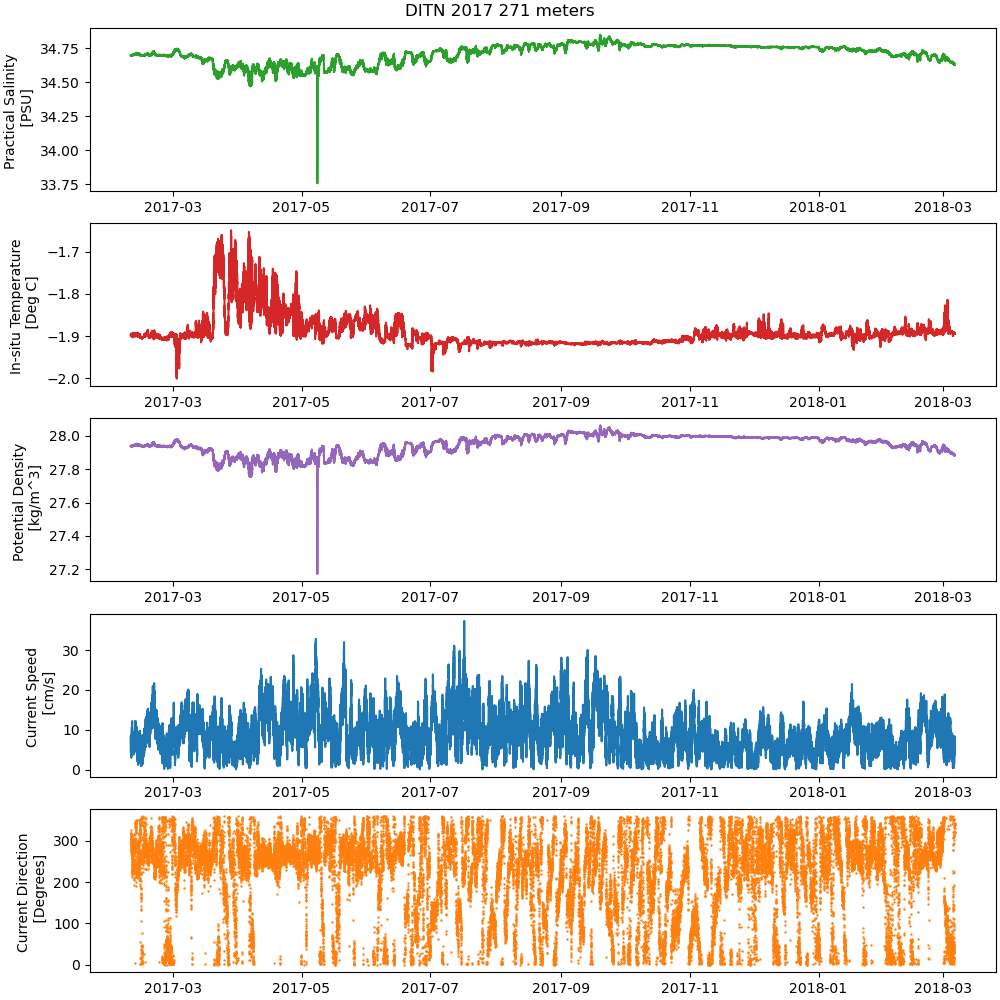

In [15]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = DITN_2017.ctd.mid
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = DITN_2017.vel.mid
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITN 2017 271 meters')

In [16]:
ds.z.values

array(271)

Text(0.5, 0.98, 'DITN 2017 694 meters')

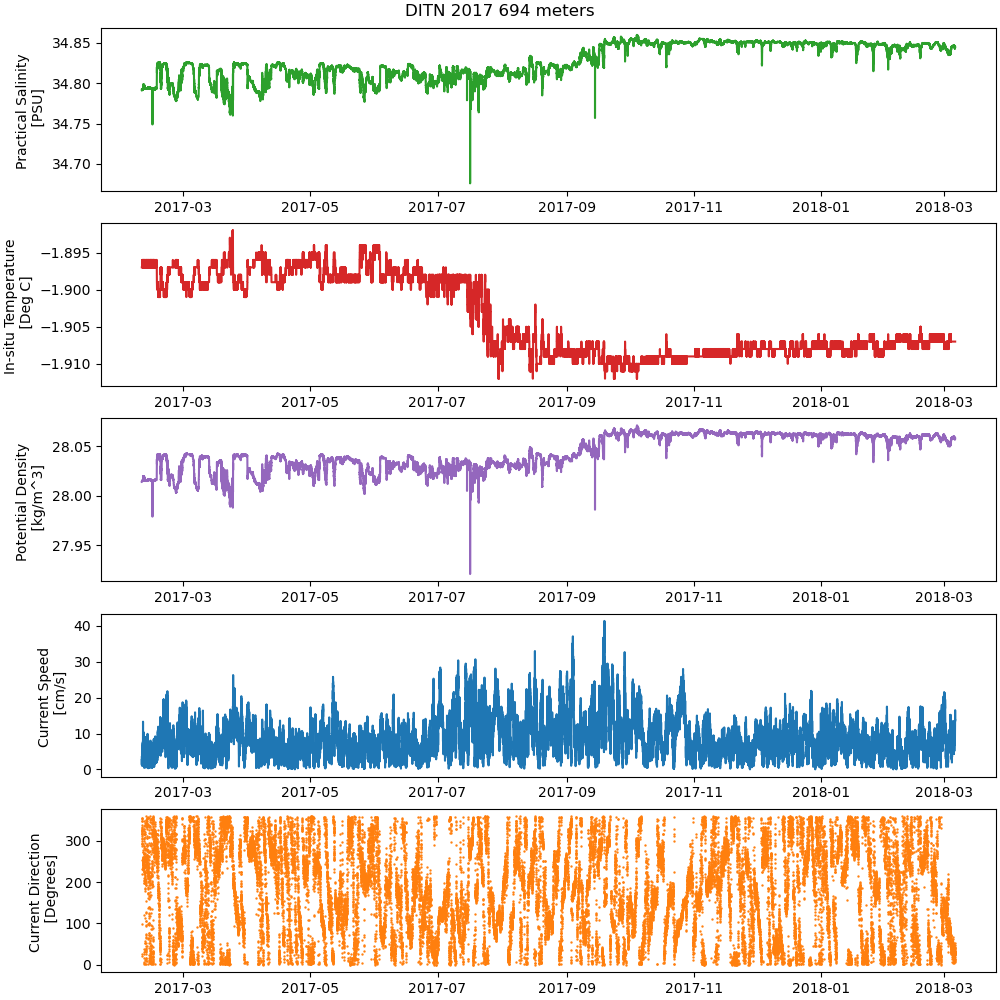

In [17]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = DITN_2017.ctd.bot
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = DITN_2017.vel.bot
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITN 2017 694 meters')

In [18]:
D_2017.ctd.top

<xarray.DataTree 'top'>
Group: /D/2017/ctd/top
    Dimensions:       (time: 35409)
    Coordinates:
        z             float64 8B ...
      * time          (time) datetime64[ns] 283kB 2017-02-11T07:00:00 ... 2019-02...
        lat           float64 8B ...
        lon           float64 8B ...
    Data variables:
        T_0           (time) float64 283kB ...
        S_0           (time) float64 283kB ...
        Conductivity  (time) float64 283kB ...
        S_2           (time) float64 283kB ...
        T_2           (time) float64 283kB ...
        sal           (time) float64 283kB ...
        temp          (time) float64 283kB ...
    Attributes: (12/14)
        cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
        cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
        water_depth_meters:              -1144
        instr_depth_meters:              -556
        instr_type:                      SBE 16
        instr_sn:                        1433
        ...                              ...
        samp_int_minutes:                30
        start_time:                      11/02/2017 07:00:00
        stop_time:                       18/02/2019 23:00:00
        level_0:                         Raw data
        level_1:                         Despiking
        level_2:                         CTD quality check

In [15]:
def Calculate_TEOS10_vars(ds):

    if 'sal' not in ds:     # this skips D/2017/ctd which is not a dataset 
        return ds
    
    ds = ds.copy()  # important: DatasetView → writable Dataset

    ds['abs_sal'] = (
        'time',
        gsw.SA_from_SP(
            SP=ds['sal'].values,
            p=ds['z'].values,
            lon=ds['lon'].values,
            lat=ds['lat'].values,
        )
    )

    ds['theta'] = (
        'time',
        gsw.pt_from_t(
            SA=ds['abs_sal'].values,
            t=ds['temp'].values,
            p=ds['z'].values,
            p_ref=0,
        )
    )

    ds['CT'] = (
        'time',
        gsw.CT_from_pt(
            SA=ds['abs_sal'].values,
            pt=ds['theta'].values,
        )
    )

    ds['sigma0'] = (
        'time',
        gsw.sigma0(
            SA=ds['abs_sal'].values,
            CT=ds['CT'].values,
        )
    )

    return ds


In [16]:
D_2017.ctd = D_2017.ctd.map_over_datasets(Calculate_TEOS10_vars)

In [17]:
D_2017.ctd

<xarray.DataTree 'ctd'>
Group: /
├── Group: /top
│       Dimensions:       (time: 35409)
│       Coordinates:
│           z             float64 8B 556.0
│         * time          (time) datetime64[ns] 283kB 2017-02-11T07:00:00 ... 2019-02...
│           lat           float64 8B -75.14
│           lon           float64 8B 164.6
│       Data variables:
│           T_0           (time) float64 283kB ...
│           S_0           (time) float64 283kB ...
│           Conductivity  (time) float64 283kB ...
│           S_2           (time) float64 283kB ...
│           T_2           (time) float64 283kB ...
│           sal           (time) float64 283kB 34.8 34.8 34.8 34.81 ... 34.77 34.77 nan
│           temp          (time) float64 283kB -1.896 -1.896 -1.896 ... -1.907 -1.907
│           abs_sal       (time) float64 283kB 34.98 34.98 34.98 ... 34.94 34.94 nan
│           theta         (time) float64 283kB -1.909 -1.909 -1.909 ... -1.917 -1.92 nan
│           CT            (time) float64 283kB -1.906 -1.906 -1.906 ... -1.917 nan
│           sigma0        (time) float64 283kB 28.03 28.03 28.03 ... 28.01 28.01 nan
│       Attributes: (12/14)
│           cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
│           cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
│           water_depth_meters:              -1144
│           instr_depth_meters:              -556
│           instr_type:                      SBE 16
│           instr_sn:                        1433
│           ...                              ...
│           samp_int_minutes:                30
│           start_time:                      11/02/2017 07:00:00
│           stop_time:                       18/02/2019 23:00:00
│           level_0:                         Raw data
│           level_1:                         Despiking
│           level_2:                         CTD quality check
├── Group: /mid
│       Dimensions:       (time: 35409)
│       Coordinates:
│           z             float64 8B 772.0
│         * time          (time) datetime64[ns] 283kB 2017-02-11T07:25:00 ... 2019-02...
│           lat           float64 8B -75.14
│           lon           float64 8B 164.6
│       Data variables: (12/13)
│           T_0           (time) float64 283kB ...
│           S_0           (time) float64 283kB ...
│           Conductivity  (time) float64 283kB ...
│           Theta_0       (time) float64 283kB ...
│           Density       (time) float64 283kB ...
│           S_2           (time) float64 283kB ...
│           ...            ...
│           sal           (time) float64 283kB 34.81 34.81 34.81 ... 34.81 34.81 34.81
│           temp          (time) float64 283kB -1.892 -1.892 -1.892 ... -1.901 -1.901
│           abs_sal       (time) float64 283kB 34.99 34.99 34.99 ... 34.98 34.98 34.98
│           theta         (time) float64 283kB -1.912 -1.912 -1.912 ... -1.921 -1.921
│           CT            (time) float64 283kB -1.909 -1.909 -1.909 ... -1.918 -1.918
│           sigma0        (time) float64 283kB 28.04 28.04 28.04 ... 28.04 28.04 28.04
│       Attributes: (12/14)
│           cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
│           cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
│           water_depth_meters:              -1144
│           instr_depth_meters:              -772
│           instr_type:                      SBE 37
│           instr_sn:                        15451
│           ...                              ...
│           samp_int_minutes:                30
│           start_time:                      11/02/2017 07:25:00
│           stop_time:                       18/02/2019 23:25:00
│           level_0:                         Raw data
│           level_1:                         Despiking
│           level_2:                         CTD quality check
└── Group: /bot
        Dimensions:       (time: 10456)
        Coordinates:
            z             float64 

In [18]:
# # calculate potential temp, absolute sal, conservative temp, etc.. 

# abs_sal = gsw.SA_from_SP(SP=D_2017.ctd.top.sal,
#                p = D_2017.ctd.top.z.values,
#                lon = D_2017.ctd.top.lon.values,
#                lat = D_2017.ctd.top.lat.values)


# theta = gsw.pt_from_t(SA=abs_sal, t=D_2017.ctd.top.temp, p = D_2017.ctd.top.z.values, p_ref=0)

# CT = gsw.CT_from_pt(SA=abs_sal, pt = theta)

# sigma0 = gsw.sigma0(SA=abs_sal, CT=CT)



In [19]:
D_2017.vel

<xarray.DataTree 'vel'>
Group: /D/2017/vel
├── Group: /D/2017/vel/top
│       Dimensions:  (time: 7691)
│       Coordinates:
│           z        float64 8B ...
│         * time     (time) datetime64[ns] 62kB 2017-02-11T20:00:00 ... 2017-12-29T06...
│           lat      float64 8B ...
│           lon      float64 8B ...
│       Data variables:
│           Mod_0    (time) float64 62kB ...
│           Dir_0    (time) float64 62kB ...
│           u        (time) float64 62kB ...
│           v        (time) float64 62kB ...
│       Attributes: (12/14)
│           cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
│           cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
│           water_depth_meters:              -1144
│           instr_depth_meters:              -576
│           instr_type:                      Aanderaa RCM7
│           instr_sn:                        11199
│           ...                              ...
│           samp_int_minutes:                30
│           start_time:                      11/02/2017 07:00:00
│           stop_time:                       18/02/2019 22:00:00
│           level_0:                         Raw data
│           level_1:                         Despiking
│           level_2:                         CTD quality check
├── Group: /D/2017/vel/mid
│       Dimensions:  (time: 35408)
│       Coordinates:
│           z        float64 8B ...
│         * time     (time) datetime64[ns] 283kB 2017-02-11T07:30:00 ... 2019-02-18T2...
│           lat      float64 8B ...
│           lon      float64 8B ...
│       Data variables:
│           u        (time) float64 283kB ...
│           v        (time) float64 283kB ...
│           Mod_0    (time) float64 283kB ...
│           Dir_0    (time) float64 283kB ...
│           TiltX    (time) float64 283kB ...
│           TiltY    (time) float64 283kB ...
│           Heading  (time) float64 283kB ...
│           AbsTilt  (time) float64 283kB ...
│           MaxTilt  (time) float64 283kB ...
│       Attributes: (12/14)
│           cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
│           cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
│           water_depth_meters:              -1144
│           instr_depth_meters:              -911
│           instr_type:                      Aanderaa Seaguard
│           instr_sn:                        1847
│           ...                              ...
│           samp_int_minutes:                30
│           start_time:                      11/02/2017 07:30:00
│           stop_time:                       18/02/2019 23:00:00
│           level_0:                         Raw data
│           level_1:                         Despiking
│           level_2:                         CTD quality check
└── Group: /D/2017/vel/bot
        Dimensions:  (time: 35357)
        Coordinates:
            z        float64 8B ...
          * time     (time) datetime64[ns] 283kB 2017-02-11T07:02:19 ... 2019-02-17T2...
            lat      float64 8B ...
            lon      float64 8B ...
        Data variables:
            u        (time) float64 283kB ...
            v        (time) float64 283kB ...
            Mod_0    (time) float64 283kB ...
            Dir_0    (time) float64 283kB ...
            T_0      (time) float64 283kB ...
            TiltX    (time) float64 283kB ...
            TiltY    (time) float64 283kB ...
            Heading  (time) float64 283kB ...
        Attributes: (12/14)
            cruise_deployment:               PNRA - XXXII Expedition - 2016/17  
            cruise_recovery:                 PNRA - XXXIV Expedition - 2019/20
            water_depth_meters:              -1144
            instr_depth_meters:              -1135
            instr_type:                      Aanderaa Seaguard
            instr_sn:                        444
            ...                              ...
            samp_int_minutes:     

AttributeError: 'DataTree' object has no attribute 'speed'

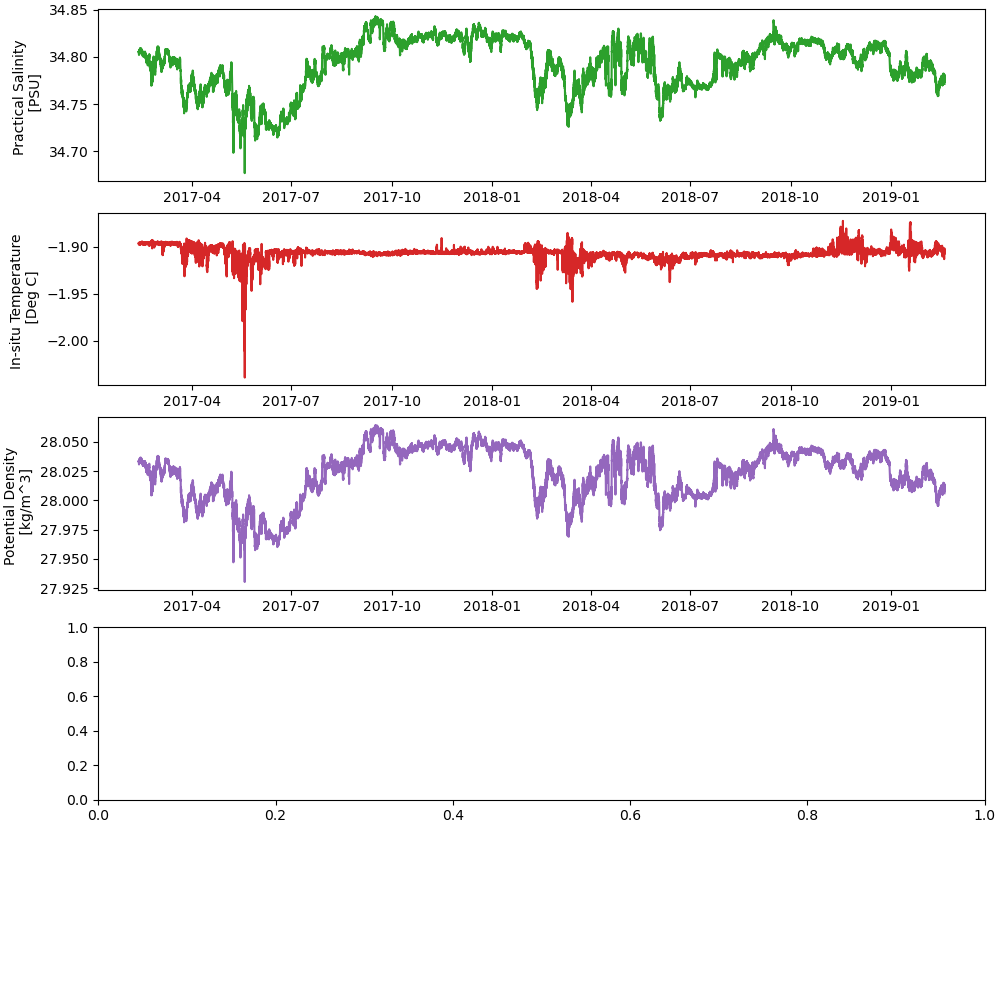

In [20]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

ds = D_2017.ctd.top
plt.subplot(5,1,1)
plt.plot(ds.time,ds.sal,color='tab:green')
plt.ylabel('Practical Salinity \n [PSU]')

plt.subplot(5,1,2)
plt.plot(ds.time,ds.temp, color='tab:red')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(5,1,3)
plt.plot(ds.time,ds.sigma0, color='tab:purple')
plt.ylabel('Potential Density \n [kg/m^3]')

ds = D_2017.vel.top
plt.subplot(5,1,4)
plt.plot(ds.time,ds.speed, color='tab:blue')
plt.ylabel('Current Speed \n [cm/s]')

plt.subplot(5,1,5)
plt.scatter(ds.time,ds.dir,s=0.5, color='tab:orange')
plt.ylabel('Current Direction \n [Degrees]')

plt.suptitle('DITN 2017 76 meters')

In [21]:
ds.z.values

array(576.)

### Mooring Comparisons - Timeseries plots 

Goal: Make timeseries plots comparing parameters across moorings at similar depths 

- DITD, DITS, D, DITN bottom sensor 

In [27]:
DITS_2017.ctd.mid.z.values

array(383)

In [39]:
LDEO.ctd.bot

<xarray.DataTree 'bot'>
Group: /LDEO/2017/ctd/bot
    Dimensions:  (time: 571394)
    Coordinates:
      * time     (time) datetime64[ns] 5MB 2017-02-01T12:00:01 ... 2018-03-05T07:...
        depth    int32 4B ...
    Data variables:
        temp     (time) float64 5MB ...
        theta    (time) float64 5MB ...
        con      (time) float64 5MB ...
        sal      (time) float64 5MB ...
        pres     (time) float64 5MB ...
        sigma0   (time) float64 5MB ...
    Attributes:
        Institution:     Lamont-Doherty Earth Observatory
        Contact:         zappa@ldeo.columbia.edu, ukm2103@columbia.edu
        DOI:             doi:10.7916/a4k3-0a14
        Instrument:      Seabird Electronics SBE 37-SM/P
        Location:        Terra Nova Bay, Antarctica
        Mooring_coords:  74.97° S, 163.96° E
        Units:           Temperature: degrees C, Conductivity: ms/C, Pressure: db...
        Notes:           Sensors at 119 m and 168 m did not measure pressure. Sen...

In [150]:
DITN_2017.ctd.bot.z.values

array(675)

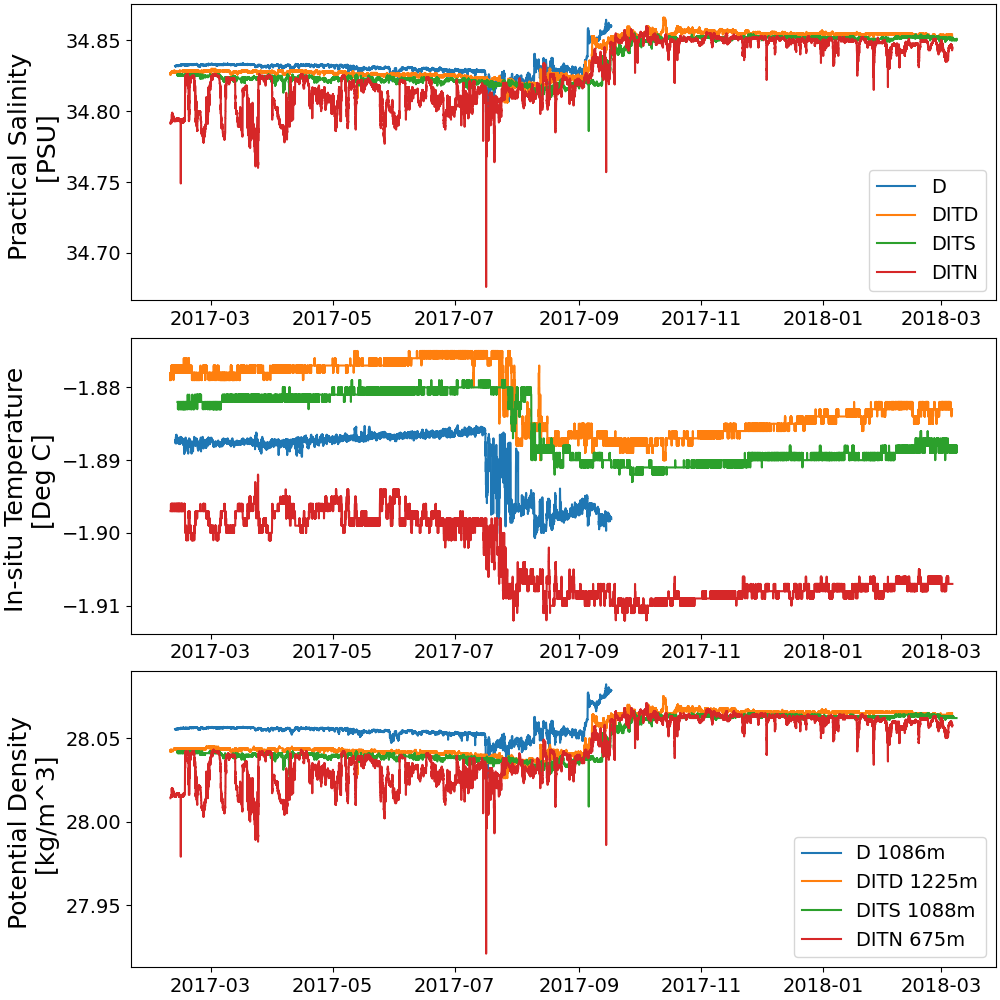

In [ ]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)

plt.subplot(3,1,1)
plt.plot(D_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),D_2017.ctd.bot,label='D')
plt.plot(DITD_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),DITD_2017.ctd.bot, label='DITD')
plt.plot(DITS_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),DITS_2017.ctd.bot,label='DITS')
plt.plot(DITN_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')), DITN_2017.ctd.bot,label='DITN')
# plt.plot(LDEO.ctd.bot.time.sel(time=slice('2017-07','2017-11')),LDEO.ctd.bot,label='LDEO')
plt.ylabel('Practical Salinity \n [PSU]')
plt.legend()

plt.subplot(3,1,2)
plt.plot(D_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),D_2017.ctd.bot.temp,label='D')
plt.plot(DITD_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),DITD_2017.ctd.bot.temp, label='DITD')
plt.plot(DITS_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),DITS_2017.ctd.bot.temp,label='DITS')
plt.plot(DITN_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')), DITN_2017.ctd.bot.temp,label='DITN')
plt.ylabel('In-situ Temperature \n [Deg C]')

plt.subplot(3,1,3)
plt.plot(D_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),D_2017.ctd.bot.sigma0,label='D 1086m')
plt.plot(DITD_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),DITD_2017.ctd.bot.sigma0, label='DITD 1225m')
plt.plot(DITS_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')),DITS_2017.ctd.bot.sigma0,label='DITS 1088m')
plt.plot(DITN_2017.ctd.bot.time.sel(time=slice('2017-07','2017-11')), DITN_2017.ctd.bot.sigma0,label='DITN 675m')
plt.ylabel('Potential Density \n [kg/m^3]')
plt.legend()

# plt.savefig('Salinity_deep_sensors_2017.png')

In [22]:
# time is fucked up on DITS, I will make my own time axis for now and will confirm this issue with Liv 
# start: 12/2/2017, end: 8/03/2018, dt = 600s
start = np.datetime64('2017-02-12T12')
end   = np.datetime64('2018-03-08T14:00:00')
dt    = np.timedelta64(600, 's')  # 600 seconds = 10 minutes

time = np.arange(start, end + dt, dt)

In [23]:
time

array(['2017-02-12T12:00:00', '2017-02-12T12:10:00',
       '2017-02-12T12:20:00', ..., '2018-03-08T13:40:00',
       '2018-03-08T13:50:00', '2018-03-08T14:00:00'],
      shape=(56029,), dtype='datetime64[s]')

NameError: name 'DITS_2017' is not defined

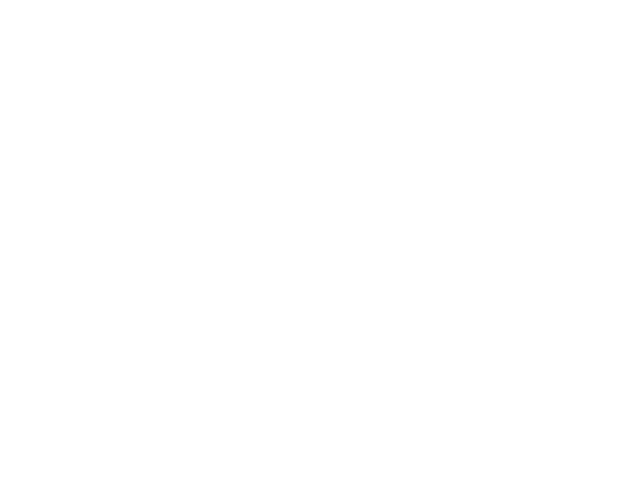

In [24]:
fig = plt.figure()
DITS_2017.ctd.bot.pres.plot()

In [15]:
DITS_2017.ctd.bot

<xarray.DataTree 'bot'>
Group: /DITS/2017/ctd/bot
    Dimensions:  (time: 112059)
    Coordinates:
        z        int64 8B ...
      * time     (time) datetime64[ns] 896kB 2017-02-12T12:00:00 ... 2018-03-08T1...
        lat      float64 8B ...
        lon      float64 8B ...
    Data variables:
        con      (time) float64 896kB 2.78 2.78 2.78 2.78 2.78 ... nan nan nan nan
        temp     (time) float64 896kB -1.882 -1.882 -1.882 -1.882 ... nan nan nan
        pres     (time) float64 896kB 1.088e+03 1.088e+03 1.088e+03 ... nan nan nan
        depth    (time) float64 896kB 1.074e+03 1.074e+03 1.074e+03 ... nan nan nan
        sal      (time) float64 896kB 34.83 34.83 34.83 34.83 ... nan nan nan nan
        sigma0   (time) float64 896kB 28.04 28.04 28.04 28.04 ... nan nan nan nan
    Attributes:
        description:  Mooring DITS 1702 SBE37SM

In [25]:
moorings['DITS/2017/ctd/bot'] = moorings['DITS/2017/ctd/bot'].to_dataset().dropna(dim='time')

In [26]:
moorings['DITS/2017/ctd/bot']['time'] = time

In [12]:
DITS_2017.ctd.bot['time'] = time

In [41]:
LDEO.ctd.bot

<xarray.DataTree 'bot'>
Group: /LDEO/2017/ctd/bot
    Dimensions:  (time: 571394)
    Coordinates:
      * time     (time) datetime64[ns] 5MB 2017-02-01T12:00:01 ... 2018-03-05T07:...
        depth    int32 4B ...
    Data variables:
        temp     (time) float64 5MB ...
        theta    (time) float64 5MB ...
        con      (time) float64 5MB ...
        sal      (time) float64 5MB nan nan nan nan nan nan ... nan nan nan nan nan
        pres     (time) float64 5MB ...
        sigma0   (time) float64 5MB ...
    Attributes:
        Institution:     Lamont-Doherty Earth Observatory
        Contact:         zappa@ldeo.columbia.edu, ukm2103@columbia.edu
        DOI:             doi:10.7916/a4k3-0a14
        Instrument:      Seabird Electronics SBE 37-SM/P
        Location:        Terra Nova Bay, Antarctica
        Mooring_coords:  74.97° S, 163.96° E
        Units:           Temperature: degrees C, Conductivity: ms/C, Pressure: db...
        Notes:           Sensors at 119 m and 168 m did not measure pressure. Sen...

### Map showing quiver plot. 

In [42]:
bath = xr.open_dataset('/Users/mackenzie/Documents/Research/PhD/TNB_Research/data/gebco_2024_n-66.2651_s-87.7985_w159.418_e213.2403.nc')

In [50]:
import rioxarray
img = rioxarray.open_rasterio('/Users/mackenzie/Documents/Quantarctica3/MackenzieBlanusa/snapshot-2017-09-14T00_00_00Z.tif')  # shape: (bands, y, x)

In [52]:
# Normalize to 0–1 range for matplotlib
rgba = img / 255.0  # now shape is (4, y, x)

# Transpose to (y, x, band) for imshow
rgba = rgba.transpose("y", "x", "band")

In [54]:
!pip install scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.4/22.4 MB 11.4 MB/s  0:00:01 eta 0:00:01


In [60]:
!pip install geopandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 8.7 MB/s  0:00:02 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [geopandas]/2 [geopandas]


In [61]:
import geopandas as gpd

In [62]:
# load shapefile (this was obtained from Quantarctica detailed basemap --> coastlines)
coast = gpd.read_file('/Users/mackenzie/Downloads/antarctic_coastlines.shp')

# clip shapefile 
# Longitude range: 160°E to 165°E
# Latitude range: -75.3° to -74.2°
# bbox = {
#     "minx": 160,
#     "maxx": 170,
#     "miny": -76,
#     "maxy": -74
# }


bbox = {
    "minx": 155,  # wider Ross Sea
    "maxx": 170,
    "miny": -78,
    "maxy": -72
}

In [64]:
from shapely.geometry import box

In [65]:
# Check the CRS
print(coast.crs)  # if it's not EPSG:4326, reproject it
if coast.crs.to_string() != "EPSG:4326":
    coast = coast.to_crs("EPSG:4326")

# Define bounding box as a shapely geometry
roi = box(bbox["minx"], bbox["miny"], bbox["maxx"], bbox["maxy"])

# Clip to Terra Nova Bay region
clipped = coast[coast.intersects(roi)]

EPSG:4326


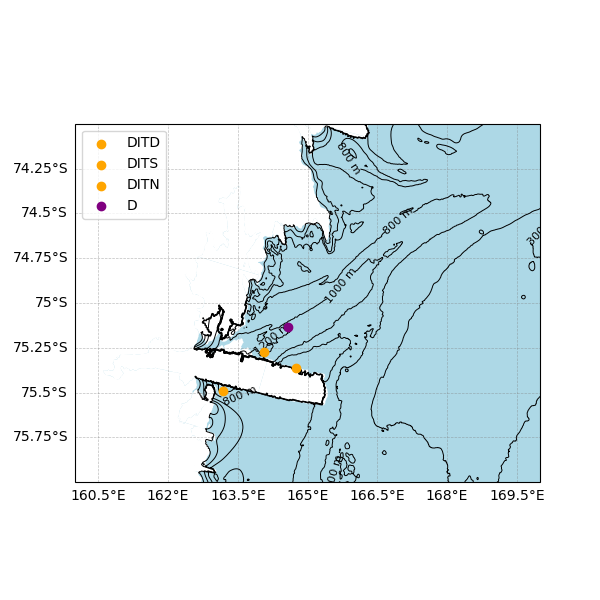

In [66]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patches as mpatches

# === Main map ===
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={"projection": ccrs.PlateCarree()})
ax.set_extent([160, 170, -76, -74])  # Terra Nova Bay

# Define extent from the dataset’s coordinates
extent = [float(img.x.min()), float(img.x.max()),
          float(img.y.min()), float(img.y.max())]

# Plot the image
ax.imshow(rgba, origin='upper', extent=extent, transform=ccrs.PlateCarree(),zorder=1)

# Fill the coastline (land/ice) polygons
clipped.plot(ax=ax, facecolor='white', edgecolor='none', transform=ccrs.PlateCarree(), zorder=1)
ax.add_feature(cfeature.OCEAN, facecolor='lightblue',zorder=0)

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

# Convert elevation to depth (positive down)
depth = -bath['elevation']

# Add contours to Cartopy plot

# levels = 10
levels = [100, 300, 500, 800, 1000, 1200, 1500, 2000, 2500, 3000]
contours = ax.contour(
    bath['lon'], bath['lat'], depth,
    levels=levels,
    colors='black',
    linewidths=0.7,
    transform=ccrs.PlateCarree(),  # very important
    zorder=2
)
# plt.clabel(contours, fmt='%d m', fontsize=8)

# plt.clabel(
#     contours,
#     contours.levels,   # <-- force every contour level to get at least one label
#     fmt='%d m',
#     fontsize=8,
#     inline=True
# )

# plt.clabel(contours, fmt='%d m', fontsize=8, inline=True, inline_spacing=1)

plt.clabel(
    contours,
    contours.levels,
    fmt='%d m',
    fontsize=8,
    manual=[(174, -72),(174, -74),(174,-71.8)]  # (lon, lat) points where labels should go
)

plt.clabel(contours, fmt='%d m', fontsize=8, inline=True, inline_spacing=1)

# ax.scatter(tnbd_vel1100.lon, tnbd_vel1100.lat, color='red', transform=ccrs.PlateCarree(), label="TNBD",zorder=10)
# ax.scatter(ldeo_lon, ldeo_lat, color='red', transform=ccrs.PlateCarree(), label="LDEO",zorder=10)
ax.scatter(DITD_2017.ctd.bot.lon, DITD_2017.ctd.bot.lat, color='orange', transform=ccrs.PlateCarree(), label="DITD",zorder=10)
ax.scatter(DITS_2017.ctd.bot.lon, DITS_2017.ctd.bot.lat, color='orange', transform=ccrs.PlateCarree(), label="DITS",zorder=10)
ax.scatter(DITN_2017.ctd.bot.lon, DITN_2017.ctd.bot.lat, color='orange', transform=ccrs.PlateCarree(), label="DITN",zorder=10)
# ax.scatter(p2_lon, p2_lat, color='green', transform=ccrs.PlateCarree(), label="P2",zorder=10)
# ax.scatter(p3_lon, p3_lat, color='green', transform=ccrs.PlateCarree(), label="P3",zorder=10)

ax.scatter(D_2017.ctd.bot.lon, D_2017.ctd.bot.lat, color='purple', transform=ccrs.PlateCarree(), label="D",zorder=10)


ax.legend()

# === Inset map ===
# Use inset_axes from matplotlib
# inset_ax = inset_axes(ax, width="35%", height="35%", loc='lower left',
# #                       axes_class=plt.Axes)
# inset_ax = plt.axes([0.7, 0.235, 0.2, 0.2], projection=ccrs.SouthPolarStereo())

# inset_ax.set_extent([-180, 180, -90, -60], crs=ccrs.PlateCarree())
# inset_ax.add_feature(cfeature.LAND, facecolor='lightgrey')
# inset_ax.coastlines(resolution='110m', linewidth=0.5)

# # Rectangle showing main map extent
# main_extent = [160, 175, -76, -71]
# rect = mpatches.Rectangle((main_extent[0], main_extent[2]),
#                           main_extent[1] - main_extent[0],
#                           main_extent[3] - main_extent[2],
#                           linewidth=1.5, edgecolor='red', facecolor='none',
#                           transform=ccrs.PlateCarree(), zorder=5)
# inset_ax.add_patch(rect)


# plt.savefig('figs/TNB_Map_URSSI_small.png',format='png',dpi=400,transparent=False)


In [76]:
plt.rcParams.update({
    'axes.titlesize': 20,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'figure.titlesize': 22
})

In [82]:
DITD_2017.vel.bot.z.values

array(1239)

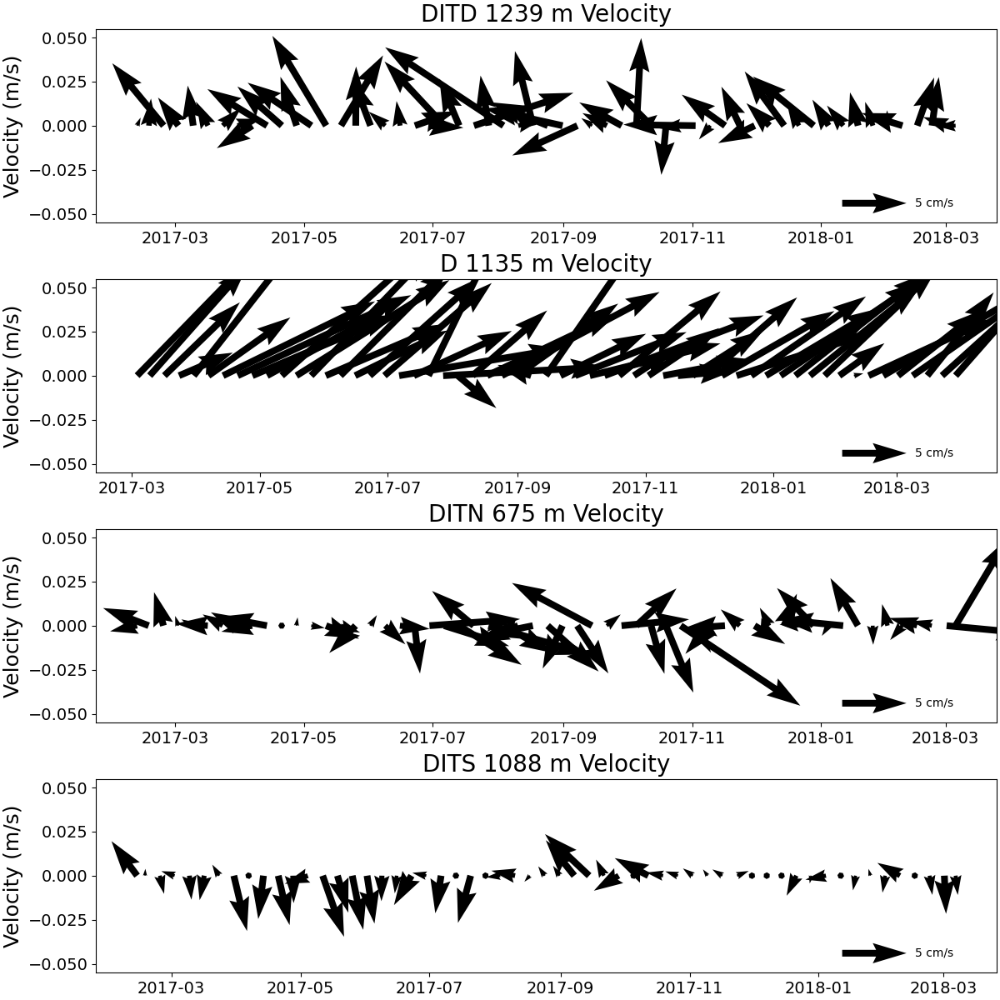

In [155]:
fig = plt.figure(figsize=(12,12),constrained_layout=True)

plt.subplot(4,1,1)
ds = DITD_2017.vel.bot
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('DITD 1239 m Velocity')
plt.ylabel('Velocity (m/s)')

plt.subplot(4,1,2)
ds = D_2017.vel.bot.sel(time=slice('2017-03','2018-03'))
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('D 1135 m Velocity')
plt.ylabel('Velocity (m/s)')

plt.subplot(4,1,3)
ds = DITN_2017.vel.bot
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('DITN 675 m Velocity')
plt.ylabel('Velocity (m/s)')

plt.subplot(4,1,4)
ds = DITS_2017.vel.bot
q = plt.quiver(
    ds.time.resample(time='W').mean().values,np.zeros(len(ds.time.resample(time='W').mean())),
    ds.u.resample(time='W').mean(),
    ds.v.resample(time='W').mean(),
    scale=70, units='width'
)
plt.quiverkey(q, X=0.90, Y=0.1, U=5, label='5 cm/s', labelpos='E')

plt.title('DITS 1088 m Velocity')
plt.ylabel('Velocity (m/s)')

plt.savefig('veloctiy_deep_sensors_2017.png')

In [163]:
moorings['D']

<xarray.DataTree 'D'>
Group: /D
├── Group: /D/2014
│   ├── Group: /D/2014/vel
│   │   ├── Group: /D/2014/vel/top
│   │   │       Dimensions:  (time: 17726)
│   │   │       Coordinates:
│   │   │           z        float64 8B ...
│   │   │         * time     (time) datetime64[ns] 142kB 2014-01-20T23:00:00 ... 2016-01-29T1...
│   │   │           lat      float64 8B ...
│   │   │           lon      float64 8B ...
│   │   │       Data variables:
│   │   │           u        (time) float64 142kB ...
│   │   │           v        (time) float64 142kB ...
│   │   │           Mod_0    (time) float64 142kB ...
│   │   │           Dir_0    (time) float64 142kB ...
│   │   │       Attributes: (12/14)
│   │   │           cruise_deployment:               PNRA - XXVII Expedition - 2013/14
│   │   │           cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
│   │   │           water_depth_meters:              -1117
│   │   │           instr_depth_meters:              -539
│   │   │           instr_type:                      RCM 7
│   │   │           instr_sn:                        11199
│   │   │           ...                              ...
│   │   │           samp_int_minutes:                60
│   │   │           start_time:                      20/01/2014 23:00:00
│   │   │           stop_time:                       30/01/2016 10:00:00
│   │   │           level_0:                         Raw data
│   │   │           level_1:                         Despiking
│   │   │           level_2:                         CTD quality check
│   │   ├── Group: /D/2014/vel/mid
│   │   │       Dimensions:  (time: 17737)
│   │   │       Coordinates:
│   │   │           z        float64 8B ...
│   │   │         * time     (time) datetime64[ns] 142kB 2014-01-21T10:00:00 ... 2016-01-30T1...
│   │   │           lat      float64 8B ...
│   │   │           lon      float64 8B ...
│   │   │       Data variables:
│   │   │           u        (time) float64 142kB ...
│   │   │           v        (time) float64 142kB ...
│   │   │           Mod_0    (time) float64 142kB ...
│   │   │           Dir_0    (time) float64 142kB ...
│   │   │       Attributes: (12/14)
│   │   │           cruise_deployment:               PNRA - XXVII Expedition - 2013/14
│   │   │           cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
│   │   │           water_depth_meters:              -1117
│   │   │           instr_depth_meters:              -875
│   │   │           instr_type:                      RCM 7
│   │   │           instr_sn:                        11566
│   │   │           ...                              ...
│   │   │           samp_int_minutes:                60
│   │   │           start_time:                      20/01/2014 23:00:00
│   │   │           stop_time:                       30/01/2016 10:00:00
│   │   │           level_0:                         Raw data
│   │   │           level_1:                         Despiking
│   │   │           level_2:                         CTD quality check
│   │   └── Group: /D/2014/vel/bot
│   │           Dimensions:  (time: 22959)
│   │           Coordinates:
│   │               z        float64 8B ...
│   │             * time     (time) datetime64[ns] 184kB 2014-01-21T09:00:00 ... 2015-05-14T1...
│   │               lat      float64 8B ...
│   │               lon      float64 8B ...
│   │           Data variables:
│   │               u        (time) float64 184kB ...
│   │               v        (time) float64 184kB ...
│   │               Mod_0    (time) float64 184kB ...
│   │               Dir_0    (time) float64 184kB ...
│   │               TiltX    (time) float64 184kB ...
│   │               TiltY    (time) float64 184kB ...
│   │               Heading  (time) float64 184kB ...
│   │               AbsTilt  (time) float64 184kB ...
│   │               MaxTilt  (time) float64 184kB ...
│   │           Attributes: (12/14)
│   │               cruise_deployment:               PNRA - XXVI

In [161]:
ds = moorings['D/2016/vel/mid'].to_dataset()

KeyError: 'Could not find node at D/2016/vel/mid'

In [159]:
ds

<xarray.Dataset> Size: 1MB
Dimensions:  (time: 16174)
Coordinates:
    z        float64 8B ...
  * time     (time) datetime64[ns] 129kB 2016-02-06T23:00:00 ... 2017-01-08T2...
    lat      float64 8B ...
    lon      float64 8B ...
Data variables:
    u        (time) float64 129kB ...
    v        (time) float64 129kB ...
    Mod_0    (time) float64 129kB ...
    Dir_0    (time) float64 129kB ...
    T_0      (time) float64 129kB ...
    TiltX    (time) float64 129kB ...
    TiltY    (time) float64 129kB ...
    Heading  (time) float64 129kB ...
    AbsTilt  (time) float64 129kB ...
    MaxTilt  (time) float64 129kB ...
Attributes: (12/14)
    cruise_deployment:               PNRA - XXXI Expedition - 2015/16  
    cruise_recovery:                 PNRA - XXXII Expedition - 2016/17
    water_depth_meters:              -1144
    instr_depth_meters:              -1109
    instr_type:                      RCM
    instr_sn:                        444
    ...                              ...
    samp_int_minutes:                30
    start_time:                      06/02/2016 22:00:00
    stop_time:                       08/01/2017 21:30:00
    level_0:                         Raw data
    level_1:                         Despiking
    level_2:                         CTD quality check

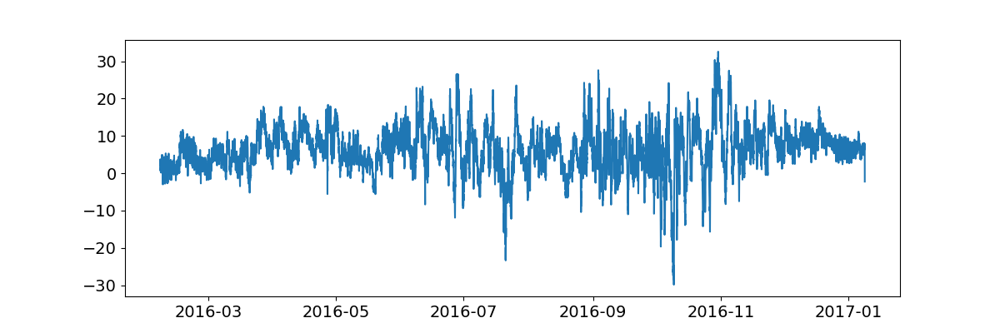

In [160]:
fig = plt.figure(figsize=(12,4))
plt.plot(ds.time,ds.v)

In [68]:
DITD_2017.vel.bot

<xarray.DataTree 'bot'>
Group: /DITD/2017/vel/bot
    Dimensions:  (time: 37488)
    Coordinates:
        z        int64 8B ...
      * time     (time) datetime64[ns] 300kB 2017-02-08T20:30:00 ... 2018-03-06T0...
        lat      float64 8B ...
        lon      float64 8B ...
    Data variables: (12/15)
        dir      (time) float64 300kB ...
        speed    (time) float64 300kB ...
        temp     (time) float64 300kB ...
        pres     (time) float64 300kB ...
        hdgt     (time) float64 300kB ...
        pitch    (time) float64 300kB ...
        ...       ...
        w        (time) float64 300kB ...
        volt     (time) float64 300kB ...
        amp1     (time) float64 300kB ...
        amp2     (time) int64 300kB ...
        amp3     (time) int64 300kB ...
        depth    (time) float64 300kB ...
    Attributes:
        description:  Mooring DITD 1702 AQD

In [85]:
# load in function that I previously copied from Una's code to test 


## ORIGINAL FUNCTION 

def sliding_window_correlation(ds1,ds2,lag_hours,sliding_window):

    """
    - ds1: dataset used for sliding window
    - ds2: dataset used for lag hours 

    """

    # calculate when correlation analysis should start 
    start = (ds1.time[0] + pd.Timedelta(lag_hours,'h'))
    end = (ds1.time[-1] - pd.Timedelta(lag_hours,'h'))

    # calculate sliding window indice based on lag_hours 
    
    sliding_window_indice = np.arange(-lag_hours,lag_hours+1,1)
    
    # calculate sliding window start and stop 
    window_stop = start + pd.Timedelta(sliding_window,'d')

    # calculate ndays
    ndays = (end-window_stop).values.astype('timedelta64[D]').astype('int')

    # calculate correlation stuff 
    corr = []
    pval = [] 
    
    for i in np.arange(0,ndays,1):
        start = (ds1.time[0] + pd.Timedelta(lag_hours,'h')) + pd.Timedelta(i,'d')
        stop = (ds1.time[0] + pd.Timedelta(lag_hours,'h') + pd.Timedelta(sliding_window,'d')) + pd.Timedelta(i,'d') 
        
        for hrs in range(len(sliding_window_indice)):
            
            sliding_start = ds1.sel(time=start).time + pd.Timedelta(sliding_window_indice[hrs],'hr')
            sliding_stop = ds1.sel(time=stop).time + pd.Timedelta(sliding_window_indice[hrs],'hr')
            
            x = signal.detrend(ds2.sel(time=slice(start,stop)))
            y = signal.detrend(ds1.sel(time=slice(sliding_start,sliding_stop)))
        
            r, p = scipy.stats.pearsonr(x, y)
            corr.append(r)
            pval.append(p)

    # convert to good format 
    corr  = np.reshape(corr, [len(np.arange(0,ndays)),len(sliding_window_indice)]) 
    pval  = np.reshape(pval, [len(np.arange(0,ndays)),len(sliding_window_indice)]) 

    start = (ds1.time[0] + pd.Timedelta(lag_hours,'h'))
    end = (ds1.time[-1] - pd.Timedelta(lag_hours,'h'))

    start_date = (ds1.time[0] + pd.Timedelta(lag_hours,'h')).values
    date_array = [start_date + np.timedelta64(i, 'D') for i in range(ndays)]


    corr = xr.DataArray(data=corr,dims=['days','lag_hours'],
             coords=dict(days=date_array,lag_hours=sliding_window_indice))

    pval = xr.DataArray(data=pval,dims=['days','lag_hours'],
                 coords=dict(days=date_array,lag_hours=sliding_window_indice))

    return corr, pval

In [129]:
def Plot_Corr_Pval(corr,pval,title):
    
    """ Plotting function for plotting sliding window correlations"""
    
    corr_significant = corr
    corr_significant = corr_significant.where(pval < 0.05)
    fig=plt.figure(figsize=(6,6)) 
    
    cmap = cmocean.cm.balance  #CET_D1A #matplotlib.cm.Spectral_r
    bounds = np.arange(-0.9,1,.2)
    norm =  matplotlib.colors.BoundaryNorm(bounds, cmap.N)
    
    
    plt.pcolormesh(corr_significant.lag_hours,corr_significant.days,corr_significant,cmap = cmap, norm=norm )
    
    plt.gca().invert_yaxis()
    cbar = plt.colorbar()
    cbar.set_label('$R$')
    
    
    plt.contour(corr_significant.lag_hours,corr_significant.days,corr_significant, colors = 'k', levels = [0.6,1], linewidths = 0.3)#cmap=colorcet.cm.coolwarm)
    plt.contour(corr_significant.lag_hours,corr_significant.days,corr_significant, colors = 'k', levels = [-1,-0.6], linewidths = 0.3)#cmap=colorcet.cm.coolwarm)
    
    # plt.xlim(-100,100)
    plt.axvline(x=0,color='k',linestyle='dashed')
    
    plt.title(title)
    plt.tight_layout()



In [93]:
ds1 = D_2017.ctd.bot.sel(time=slice('2017-04','2017-09-16')).to_dataset()

In [94]:
ds2 = DITD_2017.ctd.bot.sel(time=slice('2017-04T00:05','2017-09-16')).to_dataset().resample(time='30min').mean(dim='time')

In [109]:
DITD_2017.ctd.bot.sel(time=slice('2017-04T00:05','2017-09-16')).to_dataset()

<xarray.Dataset> Size: 7MB
Dimensions:  (time: 121677)
Coordinates:
    z        int64 8B ...
  * time     (time) datetime64[ns] 973kB 2017-04-01T00:06:00 ... 2017-09-16T2...
    lat      float64 8B -75.28
    lon      float64 8B 164.1
Data variables:
    con      (time) float64 973kB ...
    temp     (time) float64 973kB -1.877 -1.878 -1.878 ... -1.888 -1.888 -1.888
    pres     (time) float64 973kB ...
    depth    (time) float64 973kB ...
    sal      (time) float64 973kB 34.83 34.83 34.83 34.83 ... 34.85 34.85 34.85
    sigma0   (time) float64 973kB 28.04 28.04 28.04 28.04 ... 28.06 28.06 28.06
Attributes:
    description:  Mooring DITD 1702 SBE37SM

In [103]:
import numpy as np 
import matplotlib.pyplot as plt 
import xarray as xr 
import pandas as pd

import scipy
from scipy import signal
import colorcet as cc
import matplotlib
import cmocean 

In [107]:
ds1.sal

<xarray.DataArray 'sal' (time: 8112)> Size: 65kB
array([34.8327, 34.8325, 34.8326, ..., 34.8593, 34.8597, 34.86  ],
      shape=(8112,))
Coordinates:
    z        float64 8B 1.086e+03
  * time     (time) datetime64[ns] 65kB 2017-04-01T00:05:00 ... 2017-09-16T23...
    lat      float64 8B -75.14
    lon      float64 8B 164.6
Attributes:
    long_name:  Practical salinity
    units:      PSU

In [121]:
ds2_interp = DITD_2017.ctd.bot.sel(time=slice('2017-04T00:05','2017-09-16')).to_dataset().interp(time=ds1.time)

In [122]:
ds2_interp

<xarray.Dataset> Size: 454kB
Dimensions:  (time: 8112)
Coordinates:
    z        int64 8B ...
    lat      float64 8B -75.28
    lon      float64 8B 164.1
  * time     (time) datetime64[ns] 65kB 2017-04-01T00:05:00 ... 2017-09-16T23...
Data variables:
    con      (time) float64 65kB nan 2.786 2.786 2.786 ... 2.787 2.787 2.787
    temp     (time) float64 65kB nan -1.878 -1.877 ... -1.887 -1.887 -1.887
    pres     (time) float64 65kB nan 1.224e+03 1.224e+03 ... 1.224e+03 1.224e+03
    depth    (time) float64 65kB nan 1.208e+03 1.208e+03 ... 1.208e+03 1.208e+03
    sal      (time) float64 65kB nan 34.83 34.83 34.83 ... 34.85 34.85 34.85
    sigma0   (time) float64 65kB nan 28.04 28.04 28.04 ... 28.06 28.06 28.06
Attributes:
    description:  Mooring DITD 1702 SBE37SM

In [123]:
# attempt correlation for full time series of velocity data 
corr, pval = sliding_window_correlation(ds1=ds1.sal,
                                        ds2 = ds2_interp.sal,
                                        lag_hours=72,
                                        sliding_window=14)

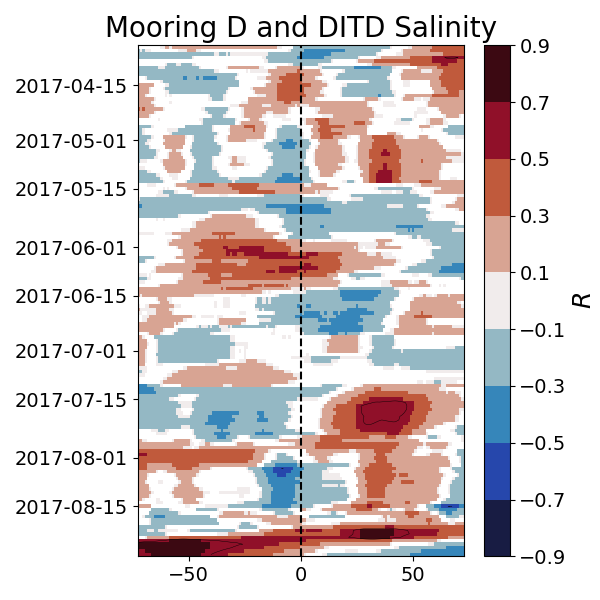

In [130]:
Plot_Corr_Pval(title='Mooring D and DITD Salinity',
               corr = corr,
               pval = pval)

# plt.xlim(20,30)

In [134]:
ds2_interp.lat

<xarray.DataArray 'lat' ()> Size: 8B
array(-75.2757)
Coordinates:
    z        int64 8B ...
    lat      float64 8B -75.28
    lon      float64 8B 164.1
Attributes:
    long_name:  Latitude
    units:      degrees_north

In [143]:
dist = 21000 #dist
speed = 0.11 #m/s


In [144]:
time = dist/speed

In [145]:
time/3600 #convert to hours

53.03030303030303

In [142]:
D_2017.vel.bot['Mod_0'].mean()

<xarray.DataArray 'Mod_0' ()> Size: 8B
array(11.0780717)
Coordinates:
    z        float64 8B 1.135e+03
    lat      float64 8B ...
    lon      float64 8B ...

### Historical Context 

Questions: 

- Does the step change in salinity and temperature happen every year? Does the change in temperature always preceed the change in salinity? 

    - This can be investigated in moorings D, DITx 

- What is the magnitude of step change between the years? 

    - Look at Rusicano (or Castagno paper) for calculation on delta R (salt flux)

- Is there a link between magnitude of step change and current direction / speed? 


In [9]:
moorings['D']

<xarray.DataTree 'D'>
Group: /D
├── Group: /D/2014
│   ├── Group: /D/2014/vel
│   │   ├── Group: /D/2014/vel/top
│   │   │       Dimensions:  (time: 17726)
│   │   │       Coordinates:
│   │   │         * time     (time) datetime64[ns] 142kB 2014-01-20T23:00:00 ... 2016-01-29T1...
│   │   │           z        float64 8B ...
│   │   │           lat      float64 8B ...
│   │   │           lon      float64 8B ...
│   │   │       Data variables:
│   │   │           u        (time) float64 142kB ...
│   │   │           v        (time) float64 142kB ...
│   │   │           Mod_0    (time) float64 142kB ...
│   │   │           Dir_0    (time) float64 142kB ...
│   │   │       Attributes: (12/14)
│   │   │           cruise_deployment:               PNRA - XXVII Expedition - 2013/14
│   │   │           cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
│   │   │           water_depth_meters:              -1117
│   │   │           instr_depth_meters:              -539
│   │   │           instr_type:                      RCM 7
│   │   │           instr_sn:                        11199
│   │   │           ...                              ...
│   │   │           samp_int_minutes:                60
│   │   │           start_time:                      20/01/2014 23:00:00
│   │   │           stop_time:                       30/01/2016 10:00:00
│   │   │           level_0:                         Raw data
│   │   │           level_1:                         Despiking
│   │   │           level_2:                         CTD quality check
│   │   ├── Group: /D/2014/vel/mid
│   │   │       Dimensions:  (time: 17737)
│   │   │       Coordinates:
│   │   │         * time     (time) datetime64[ns] 142kB 2014-01-21T10:00:00 ... 2016-01-30T1...
│   │   │           z        float64 8B ...
│   │   │           lat      float64 8B ...
│   │   │           lon      float64 8B ...
│   │   │       Data variables:
│   │   │           u        (time) float64 142kB ...
│   │   │           v        (time) float64 142kB ...
│   │   │           Mod_0    (time) float64 142kB ...
│   │   │           Dir_0    (time) float64 142kB ...
│   │   │       Attributes: (12/14)
│   │   │           cruise_deployment:               PNRA - XXVII Expedition - 2013/14
│   │   │           cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
│   │   │           water_depth_meters:              -1117
│   │   │           instr_depth_meters:              -875
│   │   │           instr_type:                      RCM 7
│   │   │           instr_sn:                        11566
│   │   │           ...                              ...
│   │   │           samp_int_minutes:                60
│   │   │           start_time:                      20/01/2014 23:00:00
│   │   │           stop_time:                       30/01/2016 10:00:00
│   │   │           level_0:                         Raw data
│   │   │           level_1:                         Despiking
│   │   │           level_2:                         CTD quality check
│   │   └── Group: /D/2014/vel/bot
│   │           Dimensions:  (time: 22959)
│   │           Coordinates:
│   │             * time     (time) datetime64[ns] 184kB 2014-01-21T09:00:00 ... 2015-05-14T1...
│   │               z        float64 8B ...
│   │               lat      float64 8B ...
│   │               lon      float64 8B ...
│   │           Data variables:
│   │               u        (time) float64 184kB ...
│   │               v        (time) float64 184kB ...
│   │               Mod_0    (time) float64 184kB ...
│   │               Dir_0    (time) float64 184kB ...
│   │               TiltX    (time) float64 184kB ...
│   │               TiltY    (time) float64 184kB ...
│   │               Heading  (time) float64 184kB ...
│   │               AbsTilt  (time) float64 184kB ...
│   │               MaxTilt  (time) float64 184kB ...
│   │           Attributes: (12/14)
│   │               cruise_deployment:               PNRA - XXVI

In [13]:
moorings.leaves

(<xarray.DataTree 'bot'>
 Group: /DITD/2017/vel/bot
     Dimensions:  (time: 37488)
     Coordinates:
       * time     (time) datetime64[ns] 300kB 2017-02-08T20:30:00 ... 2018-03-06T0...
         z        int64 8B 1239
         lat      float64 8B ...
         lon      float64 8B ...
     Data variables: (12/15)
         dir      (time) float64 300kB 202.3 225.5 215.7 220.3 ... 39.41 24.92 29.96
         speed    (time) float64 300kB 3.1 2.8 3.0 1.1 1.5 ... 3.3 1.2 4.8 3.5 3.8
         temp     (time) float64 300kB ...
         pres     (time) float64 300kB ...
         hdgt     (time) float64 300kB ...
         pitch    (time) float64 300kB ...
         ...       ...
         w        (time) float64 300kB ...
         volt     (time) float64 300kB ...
         amp1     (time) float64 300kB ...
         amp2     (time) int64 300kB ...
         amp3     (time) int64 300kB ...
         depth    (time) float64 300kB ...
     Attributes:
         description:  Mooring DITD 1702 AQD,
 <xar

In [16]:
ctd_bot_nodes = {
    node.path: node.ds
    for node in moorings['D'].subtree
    if node.is_leaf and node.path.endswith("/ctd/bot")
}


In [18]:
len(ctd_bot_nodes)

7

In [22]:
ctd_bot_nodes.keys()

dict_keys(['/D/2014/ctd/bot', '/D/2016/ctd/bot', '/D/2017/ctd/bot', '/D/2019/ctd/bot', '/D/2021/ctd/bot', '/D/2023/ctd/bot', '/D/2024/ctd/bot'])

In [23]:
ctd_bot_nodes['/D/2014/ctd/bot']

<xarray.DatasetView> Size: 2MB
Dimensions:  (time: 35528)
Coordinates:
  * time     (time) datetime64[ns] 284kB 2014-01-22T13:30:00 ... 2016-02-01T1...
    z        float64 8B ...
    lat      float64 8B ...
    lon      float64 8B ...
Data variables:
    T_0      (time) float64 284kB ...
    S_0      (time) float64 284kB ...
    S_1      (time) float64 284kB ...
    S_2      (time) float64 284kB ...
    T_2      (time) float64 284kB ...
    sal      (time) float64 284kB ...
    temp     (time) float64 284kB ...
Attributes: (12/14)
    cruise_deployment:               PNRA - XXVII Expedition - 2013/14
    cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
    water_depth_meters:              -1117
    instr_depth_meters:              -1069
    instr_type:                      SEACAT SBE16 
    instr_sn:                        1437
    ...                              ...
    samp_int_minutes:                30
    start_time:                      22/01/2014  13:30:00
    stop_time:                       01/02/2016  17:00:00
    level_0:                         Raw data
    level_1:                         Despiking
    level_2:                         CTD quality check

In [24]:
datasets = []
labels = []

for path, ds in ctd_bot_nodes.items():
    mooring, year, _, _ = path.strip("/").split("/")
    datasets.append(ds)
    labels.append(f"{mooring}_{year}")


In [31]:
datasets

[<xarray.DatasetView> Size: 2MB
 Dimensions:  (time: 35528)
 Coordinates:
   * time     (time) datetime64[ns] 284kB 2014-01-22T13:30:00 ... 2016-02-01T1...
     z        float64 8B ...
     lat      float64 8B ...
     lon      float64 8B ...
 Data variables:
     T_0      (time) float64 284kB ...
     S_0      (time) float64 284kB ...
     S_1      (time) float64 284kB ...
     S_2      (time) float64 284kB ...
     T_2      (time) float64 284kB ...
     sal      (time) float64 284kB ...
     temp     (time) float64 284kB ...
 Attributes: (12/14)
     cruise_deployment:               PNRA - XXVII Expedition - 2013/14
     cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
     water_depth_meters:              -1117
     instr_depth_meters:              -1069
     instr_type:                      SEACAT SBE16 
     instr_sn:                        1437
     ...                              ...
     samp_int_minutes:                30
     start_time:                    

In [25]:
combined = xr.concat(
    datasets,
    dim=xr.DataArray(labels, dims="series", name="series")
)


C:\Users\mblan\AppData\Local\Temp\ipykernel_29088\155466107.py:1: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  combined = xr.concat(


In [41]:
combined

<xarray.Dataset> Size: 127MB
Dimensions:       (series: 7, time: 147853)
Coordinates:
  * series        (series) <U6 168B 'D_2014' 'D_2016' ... 'D_2023' 'D_2024'
  * time          (time) datetime64[ns] 1MB 2014-01-22T13:30:00 ... 2025-02-0...
    z             (series) float64 56B 1.069e+03 1.06e+03 ... 1.2e+03 1.176e+03
    lat           (series) float64 56B -75.14 -75.14 -75.14 ... -75.17 -75.17
    lon           (series) float64 56B 164.6 164.6 164.6 164.7 165.0 164.6 164.6
    monthday      (time) object 1MB '01-22' '01-22' '01-22' ... '02-08' '02-08'
Data variables: (12/15)
    T_0           (series, time) float64 8MB -1.882 -1.882 ... -1.886 -1.886
    S_0           (series, time) float64 8MB 35.43 35.43 35.43 ... 34.86 34.86
    S_1           (series, time) float64 8MB 35.43 35.43 35.43 ... nan nan nan
    S_2           (series, time) float64 8MB 34.78 34.78 34.78 ... 34.87 34.87
    T_2           (series, time) float64 8MB -1.886 -1.886 ... -1.885 -1.885
    sal           (series, time) float64 8MB 34.78 34.78 34.78 ... 34.87 34.87
    ...            ...
    Oxygen        (series, time) float64 8MB nan nan nan nan ... nan nan nan nan
    Depth         (series, time) float64 8MB nan nan nan ... 1.177e+03 1.177e+03
    Density       (series, time) float64 8MB nan nan nan nan ... nan nan nan nan
    Pressure      (series, time) float64 8MB nan nan nan ... 1.193e+03 1.193e+03
    Depth_0       (series, time) float64 8MB nan nan nan nan ... nan nan nan nan
    Pressure_0    (series, time) float64 8MB nan nan nan nan ... nan nan nan nan
Attributes: (12/14)
    cruise_deployment:               PNRA - XXVII Expedition - 2013/14
    cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
    water_depth_meters:              -1117
    instr_depth_meters:              -1069
    instr_type:                      SEACAT SBE16 
    instr_sn:                        1437
    ...                              ...
    samp_int_minutes:                30
    start_time:                      22/01/2014  13:30:00
    stop_time:                       01/02/2016  17:00:00
    level_0:                         Raw data
    level_1:                         Despiking
    level_2:                         CTD quality check

In [33]:
ds = xr.concat(datasets,dim='time')

C:\Users\mblan\AppData\Local\Temp\ipykernel_29088\635418379.py:1: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
  ds = xr.concat(datasets,dim='time')


In [40]:
combined = combined.assign_coords(
    monthday=("time", combined.time.dt.strftime("%m-%d").data)
)

In [38]:
combined.groupby("time.month").mean('time')

<xarray.Dataset> Size: 11kB
Dimensions:       (month: 12, series: 7)
Coordinates:
  * month         (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * series        (series) <U6 168B 'D_2014' 'D_2016' ... 'D_2023' 'D_2024'
    z             (series) float64 56B 1.069e+03 1.06e+03 ... 1.2e+03 1.176e+03
    lat           (series) float64 56B -75.14 -75.14 -75.14 ... -75.17 -75.17
    lon           (series) float64 56B 164.6 164.6 164.6 164.7 165.0 164.6 164.6
Data variables: (12/15)
    T_0           (month, series) float64 672B -1.885 nan nan ... -1.888 -1.889
    S_0           (month, series) float64 672B 35.43 nan nan ... 34.87 34.86
    S_1           (month, series) float64 672B 35.43 nan nan nan ... nan nan nan
    S_2           (month, series) float64 672B 34.81 nan nan ... 34.88 34.87
    T_2           (month, series) float64 672B -1.885 nan nan ... -1.887 -1.888
    sal           (month, series) float64 672B 34.81 nan nan ... 34.88 34.87
    ...            ...
    Oxygen        (month, series) float64 672B nan nan nan nan ... nan nan nan
    Depth         (month, series) float64 672B nan nan nan ... nan nan 1.177e+03
    Density       (month, series) float64 672B nan nan nan nan ... nan nan nan
    Pressure      (month, series) float64 672B nan nan nan ... nan nan 1.193e+03
    Depth_0       (month, series) float64 672B nan nan nan ... 1.071e+03 nan nan
    Pressure_0    (month, series) float64 672B nan nan nan ... 1.085e+03 nan nan
Attributes: (12/14)
    cruise_deployment:               PNRA - XXVII Expedition - 2013/14
    cruise_recovery:                 PNRA - XXVII Expedition - 2015/16
    water_depth_meters:              -1117
    instr_depth_meters:              -1069
    instr_type:                      SEACAT SBE16 
    instr_sn:                        1437
    ...                              ...
    samp_int_minutes:                30
    start_time:                      22/01/2014  13:30:00
    stop_time:                       01/02/2016  17:00:00
    level_0:                         Raw data
    level_1:                         Despiking
    level_2:                         CTD quality check

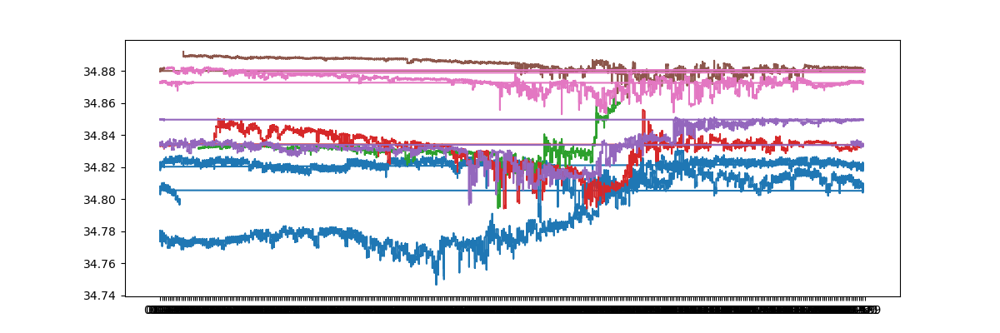

In [48]:
fig = plt.figure(figsize=(12,4))
plt.plot(combined.monthday,combined.sal.isel(series=0))
plt.plot(combined.monthday,combined.sal.isel(series=1))
plt.plot(combined.monthday,combined.sal.isel(series=2))
plt.plot(combined.monthday,combined.sal.isel(series=3))
plt.plot(combined.monthday,combined.sal.isel(series=4))
plt.plot(combined.monthday,combined.sal.isel(series=5))
plt.plot(combined.monthday,combined.sal.isel(series=6))